# Project 1: SAT & ACT Analysis

The first markdown cell in a notebook is a great place to provide an overview of your entire project. You will likely want to at least state your

## Problem Statement

#### How can the College Board increase the support in states that has low SAT participation rates ? 

## Executive Summary

If you want to, it's great to use relative links to direct your audience to various sections of a notebook. **HERE'S A DEMONSTRATION WITH THE CURRENT SECTION HEADERS**:

The new format for the SAT was released in March 2016. As an employee of the College Board - the organization that administers the SAT - you are a part of a team that tracks statewide participation and recommends where money is best spent to improve SAT participation rates. Your presentation and report should be geared toward **non-technical** executives with the College Board and you will use the provided data and outside research to make recommendations about how the College Board might work to increase the participation rate in a **state of your choice**.

- The ACT and SAT test are standardized tests used for college admissions in the United States. 

- The ACT is divided into four multiple choice subject tests: English, Maths, Reading and Science with scores ranging from 1-36 for each subject.

- 2 sction scores result from taking the SAT: Evident-based Reading and Writing and Math. Section scores are reported on a range of 200-800.

- The sample data is extracted from the following sites:
    - https://blog.prepscholar.com/act-scores-by-state-averages-highs-and-lows
    - https://blog.collegevine.com/here-are-the-average-sat-scores-by-state/

### Contents:
- [2017 Data Import & Cleaning](#Data-Import-and-Cleaning)
- [2018 Data Import and Cleaning](#2018-Data-Import-and-Cleaning)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [Data Visualization](#Visualize-the-data)
- [Descriptive and Inferential Statistics](#Descriptive-and-Inferential-Statistics)
- [Outside Research](#Outside-Research)
- [Conclusions and Recommendations](#Conclusions-and-Recommendations)

**If you combine your problem statement, executive summary, data dictionary, and conclusions/recommendations, you have an amazing README.md file that quickly aligns your audience to the contents of your project.** Don't forget to cite your data sources!

*All libraries used should be added here*

In [1]:
#Imports:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
from scipy import stats

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## 2017 Data Import and Cleaning

#### 1. Read In SAT & ACT  Data

Read in the `sat_2017.csv` and `act_2017.csv` files and assign them to appropriately named pandas dataframes.

In [2]:
#Code:
sat_2017=pd.read_csv("data/sat_2017.csv")
act_2017=pd.read_csv("data/act_2017.csv")

#### 2. Display Data

Print the first 10 rows of each dataframe to your jupyter notebook

In [3]:
#Code:
sat_2017.head(10)

,State,Participation,Evidence-Based Reading and Writing,Math,Total
0,Alabama,5%,593,572,1165
1,Alaska,38%,547,533,1080
2,Arizona,30%,563,553,1116
3,Arkansas,3%,614,594,1208
4,California,53%,531,524,1055
5,Colorado,11%,606,595,1201
6,Connecticut,100%,530,512,1041
7,Delaware,100%,503,492,996
8,District of Columbia,100%,482,468,950
9,Florida,83%,520,497,1017


In [4]:
act_2017.head(10)

,State,Participation,English,Math,Reading,Science,Composite
0,National,60%,20.3,20.7,21.4,21.0,21.0
1,Alabama,100%,18.9,18.4,19.7,19.4,19.2
2,Alaska,65%,18.7,19.8,20.4,19.9,19.8
3,Arizona,62%,18.6,19.8,20.1,19.8,19.7
4,Arkansas,100%,18.9,19.0,19.7,19.5,19.4
5,California,31%,22.5,22.7,23.1,22.2,22.8
6,Colorado,100%,20.1,20.3,21.2,20.9,20.8
7,Connecticut,31%,25.5,24.6,25.6,24.6,25.2
8,Delaware,18%,24.1,23.4,24.8,23.6,24.1
9,District of Columbia,32%,24.4,23.5,24.9,23.5,24.2


#### 3. Verbally Describe Data

Take your time looking through the data and thoroughly describe the data in the markdown cell below. 

Answer: 
- sat_2017 comprises of 5 columns: 
    - individual States in US
    - participation Rate (%) 
    - average evident Reading & writing score
    - average math score
    - average total score (evident Reading & writing score + math score)
    
    
- act_2017 comprises of 7 columns:
    - individual States in US
    - participation Rate (%) 
    - average english score
    - average math score
    - average reading score
    - average science score
    - average total score
    

- For SAT, Science is not tested while English/Reading are combined and reported as 1 score under Evience based reading and writing. 



#### 4a. Does the data look complete? 

Answer: 
- Yes, from the .info method of each of the data frame, we do not see any null records in the respective columns

In [5]:
sat_2017[sat_2017.isnull() != False].count()

State                                 0
Participation                         0
Evidence-Based Reading and Writing    0
Math                                  0
Total                                 0
dtype: int64

In [6]:
act_2017[act_2017.isnull() != False].count()

State            0
Participation    0
English          0
Math             0
Reading          0
Science          0
Composite        0
dtype: int64

In [7]:
sat_2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51 entries, 0 to 50
Data columns (total 5 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   State                               51 non-null     object
 1   Participation                       51 non-null     object
 2   Evidence-Based Reading and Writing  51 non-null     int64 
 3   Math                                51 non-null     int64 
 4   Total                               51 non-null     int64 
dtypes: int64(3), object(2)
memory usage: 2.1+ KB


In [8]:
act_2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   State          52 non-null     object 
 1   Participation  52 non-null     object 
 2   English        52 non-null     float64
 3   Math           52 non-null     float64
 4   Reading        52 non-null     float64
 5   Science        52 non-null     float64
 6   Composite      52 non-null     object 
dtypes: float64(4), object(3)
memory usage: 3.0+ KB


#### 4b. Are there any obvious issues with the observations?

**What is the minimum *possible* value for each test/subtest? What is the maximum *possible* value?**

Consider comparing any questionable values to the sources of your data:
- [SAT](https://blog.collegevine.com/here-are-the-average-sat-scores-by-state/)
- [ACT](https://blog.prepscholar.com/act-scores-by-state-averages-highs-and-lows)

In [9]:
sat_2017.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Evidence-Based Reading and Writing,51.0,569.117647,45.666901,482.0,533.5,559.0,613.0,644.0
Math,51.0,547.627451,84.909119,52.0,522.0,548.0,599.0,651.0
Total,51.0,1126.098039,92.494812,950.0,1055.5,1107.0,1212.0,1295.0


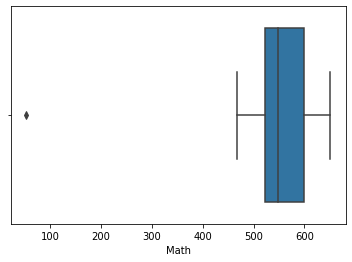

In [10]:
sns.boxplot(sat_2017['Math']);

Observation: From the boxplot, we see an outlier in the Math score for SAT 2017

In [11]:
sat_2017[sat_2017['Math']==52]

,State,Participation,Evidence-Based Reading and Writing,Math,Total
20,Maryland,69%,536,52,1060


Findings: The outlier is occuring in the Maryland State

In [12]:
act_2017.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
English,52.0,20.919231,2.332132,16.3,19.000,20.55,23.300,25.5
Math,52.0,21.173077,1.963602,18.0,19.400,20.90,23.100,25.3
Reading,52.0,22.001923,2.048672,18.1,20.475,21.70,24.125,26.0
Science,52.0,21.040385,3.151113,2.3,19.900,21.15,22.525,24.9


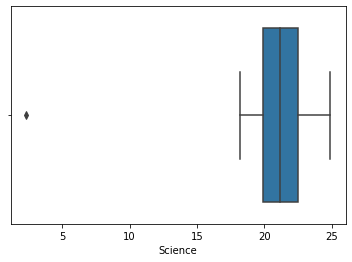

In [13]:
sns.boxplot(act_2017['Science']);

Observation: From the boxplot, we see an outlier in the Science score for ACT 2017

In [14]:
act_2017[act_2017['Science']==2.3]

,State,Participation,English,Math,Reading,Science,Composite
21,Maryland,28%,23.3,23.1,24.2,2.3,23.6


Findings: The outlier is occuring in the Maryland State

Answer: 
- From the data in the given csv file, we noticed that SAT_2017's Math has an outlier score of 52 while ACT_2017's Science score has an outlier at 2.3.
- Upon further check against the source, we realised that the SAT_2017's Math score should be 524 and not 52, also the ACT_2017's Science score should be 23.2 instead of 2.3
-  Also, there is an error in the data value for Wyoming's Composite (should be 20.2 instead of 20.2X), then column should be in float

#### 4c. Fix any errors you identified

**The data is available** so there's no need to guess or calculate anything. If you didn't find any errors, continue to the next step.

In [15]:
##Before:
act_2017[act_2017['State']=='Wyoming']

,State,Participation,English,Math,Reading,Science,Composite
51,Wyoming,100%,19.4,19.8,20.8,20.6,20.2x


In [16]:
#code
#Fix the error - for Wyoming's Composite (should be 20.2 instead of 20.2X)
act_2017.loc[act_2017['State']=='Wyoming','Composite']=20.2

In [17]:
#After:
act_2017[act_2017['State']=='Wyoming']

,State,Participation,English,Math,Reading,Science,Composite
51,Wyoming,100%,19.4,19.8,20.8,20.6,20.2


In [18]:
##Before:
act_2017.loc[act_2017['State']=='Maryland']

,State,Participation,English,Math,Reading,Science,Composite
21,Maryland,28%,23.3,23.1,24.2,2.3,23.6


In [19]:
act_2017.loc[act_2017['State']=='Maryland','Science']=23.2

In [20]:
##After:
act_2017.loc[act_2017['State']=='Maryland']

,State,Participation,English,Math,Reading,Science,Composite
21,Maryland,28%,23.3,23.1,24.2,23.2,23.6


In [21]:
##Before:
sat_2017.loc[sat_2017['State']=='Maryland']

,State,Participation,Evidence-Based Reading and Writing,Math,Total
20,Maryland,69%,536,52,1060


In [22]:
sat_2017.loc[sat_2017['State']=='Maryland','Math']=524

In [23]:
##After:
sat_2017.loc[sat_2017['State']=='Maryland']

,State,Participation,Evidence-Based Reading and Writing,Math,Total
20,Maryland,69%,536,524,1060


#### 5. What are your data types? 
Display the data types of each feature. 

In [24]:
#code
sat_2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51 entries, 0 to 50
Data columns (total 5 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   State                               51 non-null     object
 1   Participation                       51 non-null     object
 2   Evidence-Based Reading and Writing  51 non-null     int64 
 3   Math                                51 non-null     int64 
 4   Total                               51 non-null     int64 
dtypes: int64(3), object(2)
memory usage: 2.1+ KB


In [25]:
act_2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   State          52 non-null     object 
 1   Participation  52 non-null     object 
 2   English        52 non-null     float64
 3   Math           52 non-null     float64
 4   Reading        52 non-null     float64
 5   Science        52 non-null     float64
 6   Composite      52 non-null     object 
dtypes: float64(4), object(3)
memory usage: 3.0+ KB


What did you learn?
- Do any of them seem odd?  
- Which ones are not as they should be?  

Answer:
- Participation in both csv files are in "%" string, thus it is more appropriate change the data_type to float. 
- Also, the Composite in act_2017 should be a float value

#### 6. Fix Incorrect Data Types
Based on what you discovered above, use appropriate methods to re-type incorrectly typed data.
- Define a function that will allow you to convert participation rates to an appropriate numeric type. Use `map` or `apply` to change these columns in each dataframe.

In [26]:
#Replace % in the Participation column & changes the "Participation" column data type to numeric 

def convert_to_num(df):
    df['Participation']=df['Participation'].str.replace('%',"").apply(pd.to_numeric, errors='coerce')
    return df

In [27]:
convert_to_num(act_2017)

,State,Participation,English,Math,Reading,Science,Composite
0,National,60,20.3,20.7,21.4,21.0,21.0
1,Alabama,100,18.9,18.4,19.7,19.4,19.2
2,Alaska,65,18.7,19.8,20.4,19.9,19.8
3,Arizona,62,18.6,19.8,20.1,19.8,19.7
4,Arkansas,100,18.9,19.0,19.7,19.5,19.4
5,California,31,22.5,22.7,23.1,22.2,22.8
6,Colorado,100,20.1,20.3,21.2,20.9,20.8
7,Connecticut,31,25.5,24.6,25.6,24.6,25.2
8,Delaware,18,24.1,23.4,24.8,23.6,24.1
9,District of Columbia,32,24.4,23.5,24.9,23.5,24.2


In [28]:
convert_to_num(sat_2017)

,State,Participation,Evidence-Based Reading and Writing,Math,Total
0,Alabama,5,593,572,1165
1,Alaska,38,547,533,1080
2,Arizona,30,563,553,1116
3,Arkansas,3,614,594,1208
4,California,53,531,524,1055
5,Colorado,11,606,595,1201
6,Connecticut,100,530,512,1041
7,Delaware,100,503,492,996
8,District of Columbia,100,482,468,950
9,Florida,83,520,497,1017


In [29]:
## After:
act_2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   State          52 non-null     object 
 1   Participation  52 non-null     int64  
 2   English        52 non-null     float64
 3   Math           52 non-null     float64
 4   Reading        52 non-null     float64
 5   Science        52 non-null     float64
 6   Composite      52 non-null     object 
dtypes: float64(4), int64(1), object(2)
memory usage: 3.0+ KB


- Fix any individual values preventing other columns from being the appropriate type.

In [30]:
#code - Converts the data type in Composite to integer 
act_2017['Composite'] = act_2017['Composite'].apply(pd.to_numeric, errors='coerce')

- Finish your data modifications by making sure the columns are now typed appropriately.

- Display the data types again to confirm they are correct.

In [31]:
#Code:
sat_2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51 entries, 0 to 50
Data columns (total 5 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   State                               51 non-null     object
 1   Participation                       51 non-null     int64 
 2   Evidence-Based Reading and Writing  51 non-null     int64 
 3   Math                                51 non-null     int64 
 4   Total                               51 non-null     int64 
dtypes: int64(4), object(1)
memory usage: 2.1+ KB


In [32]:
act_2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   State          52 non-null     object 
 1   Participation  52 non-null     int64  
 2   English        52 non-null     float64
 3   Math           52 non-null     float64
 4   Reading        52 non-null     float64
 5   Science        52 non-null     float64
 6   Composite      52 non-null     float64
dtypes: float64(5), int64(1), object(1)
memory usage: 3.0+ KB


#### 7. Rename Columns
Change the names of the columns to more expressive names so that you can tell the difference the SAT columns and the ACT columns. Your solution should map all column names being changed at once (no repeated singular name-changes). **We will be combining these data with some of the data from 2018, and so you should name columns in an appropriate way**.

**Guidelines**:
- Column names should be all lowercase (you will thank yourself when you start pushing data to SQL later in the course)
- Column names should not contain spaces (underscores will suffice--this allows for using the `df.column_name` method to access columns in addition to `df['column_name']`.
- Column names should be unique and informative (the only feature that we actually share between dataframes is the state).

In [33]:
# rename the columns in SAT_2017 
sat_2017.rename(columns={
    "Participation" : "sat2017_Participation",
    "Evidence-Based Reading and Writing" : "sat2017_Evidence-Based RW",
    "Math" : "sat2017_Math",
    "Total" : "sat2017_Total"
},inplace=True)

In [34]:
# rename the columns in ACT_2017 
act_2017.rename(columns={
    "Participation" : "act2017_Participation",
    "English" : "act2017_English",
    "Math" : "act2017_Math",
    "Reading" : "act2017_Reading",
    "Science" : "act2017_Science",
    "Composite" : "act2017_Composite"
},inplace=True)

In [35]:
# added a function to format the values in the columns
def clean_columns(x):
    x.columns=x.columns.str.lower()
    x.columns=x.columns.str.replace('-'," ")
    x.columns=x.columns.str.replace(" ","_")
    return (x.columns)

In [36]:
clean_columns(sat_2017)

Index(['state', 'sat2017_participation', 'sat2017_evidence_based_rw',
       'sat2017_math', 'sat2017_total'],
      dtype='object')

In [37]:
clean_columns(act_2017)

Index(['state', 'act2017_participation', 'act2017_english', 'act2017_math',
       'act2017_reading', 'act2017_science', 'act2017_composite'],
      dtype='object')

#### 8. Create a data dictionary

Now that we've fixed our data, and given it appropriate names, let's create a [data dictionary](http://library.ucmerced.edu/node/10249). 

A data dictionary provides a quick overview of features/variables/columns, alongside data types and descriptions. The more descriptive you can be, the more useful this document is.

Example of a Fictional Data Dictionary Entry: 

|Feature|Type|Dataset|Description|
|---|---|---|---|
|**county_pop**|*integer*|2010 census|The population of the county (units in thousands, where 2.5 represents 2500 people).| 
|**per_poverty**|*float*|2010 census|The percent of the county over the age of 18 living below the 200% of official US poverty rate (units percent to two decimal places 98.10 means 98.1%)|

[Here's a quick link to a short guide for formatting markdown in Jupyter notebooks](https://jupyter-notebook.readthedocs.io/en/stable/examples/Notebook/Working%20With%20Markdown%20Cells.html).

Provided is the skeleton for formatting a markdown table, with columns headers that will help you create a data dictionary to quickly summarize your data, as well as some examples. **This would be a great thing to copy and paste into your custom README for this project.**

|Feature|Type|Dataset|Description|
|---|---|---|---|
|state|object|ACT/SAT|States that participated in the ACT/SAT examination| 
|act2017_participation|int|ACT|State participation rates (%)| 
|act2017_english|float|ACT|Average English Score which ranges between 1 and 36| 
|act2017_math|float|ACT|Average Math Score which ranges between 1 and 36|
|act2017_reading|float|ACT|Average Reading Score which ranges between 1 and 36|
|act2017_science|float|ACT|Average Science Score which ranges between 1 and 36|
|act2017_composite|float|ACT|Average Composite Score which ranges between 1 and 36|
|sat2017_participation|int|SAT|State participation rates (%)|
|sat2017_evidence_based_rw|int|SAT|Average Evidence-Based Reading and Writing Score which ranges between 200 and 800|
|sat2017_math|int|SAT|Average Math Score which ranges between 200 and 800|
|sat2017_total|int|SAT|Average Total Score that aggregates Evidence-Based Reading and Writing and Math Scores, ranges between 400 and 1600|

#### 9. Drop unnecessary rows

One of our dataframes contains an extra row. Identify and remove this from the dataframe.

In [38]:
#Before:
act_2017

,state,act2017_participation,act2017_english,act2017_math,act2017_reading,act2017_science,act2017_composite
0,National,60,20.3,20.7,21.4,21.0,21.0
1,Alabama,100,18.9,18.4,19.7,19.4,19.2
2,Alaska,65,18.7,19.8,20.4,19.9,19.8
3,Arizona,62,18.6,19.8,20.1,19.8,19.7
4,Arkansas,100,18.9,19.0,19.7,19.5,19.4
5,California,31,22.5,22.7,23.1,22.2,22.8
6,Colorado,100,20.1,20.3,21.2,20.9,20.8
7,Connecticut,31,25.5,24.6,25.6,24.6,25.2
8,Delaware,18,24.1,23.4,24.8,23.6,24.1
9,District of Columbia,32,24.4,23.5,24.9,23.5,24.2


In [39]:
#remove the extra row where state = "National" as we are only analyzing the states  
act_2017.drop(0,inplace=True)

In [40]:
act_2017.head()

,state,act2017_participation,act2017_english,act2017_math,act2017_reading,act2017_science,act2017_composite
1,Alabama,100,18.9,18.4,19.7,19.4,19.2
2,Alaska,65,18.7,19.8,20.4,19.9,19.8
3,Arizona,62,18.6,19.8,20.1,19.8,19.7
4,Arkansas,100,18.9,19.0,19.7,19.5,19.4
5,California,31,22.5,22.7,23.1,22.2,22.8


In [41]:
#code - reset the index for act_2017
act_2017.reset_index(drop = True,inplace=True)

#### 10. Merge Dataframes

Join the 2017 ACT and SAT dataframes using the state in each dataframe as the key. Assign this to a new variable.

In [42]:
#Code: merging the 2017 dataframes into the combined dataframe 
combined_2017=pd.merge(act_2017,sat_2017, on='state')
combined_2017.head()

,state,act2017_participation,act2017_english,act2017_math,act2017_reading,act2017_science,act2017_composite,sat2017_participation,sat2017_evidence_based_rw,sat2017_math,sat2017_total
0,Alabama,100,18.9,18.4,19.7,19.4,19.2,5,593,572,1165
1,Alaska,65,18.7,19.8,20.4,19.9,19.8,38,547,533,1080
2,Arizona,62,18.6,19.8,20.1,19.8,19.7,30,563,553,1116
3,Arkansas,100,18.9,19.0,19.7,19.5,19.4,3,614,594,1208
4,California,31,22.5,22.7,23.1,22.2,22.8,53,531,524,1055


#### 11. Save your cleaned, merged dataframe

Use a relative path to save out your data as `combined_2017.csv`.

In [43]:
#code: Exporting the csv file to the indicated directory
combined_2017.to_csv("data/combined_2017.csv")

## 2018 Data Import and Cleaning

Links to the 2018 ACT and SAT data are provided in the README. These data live in PDFs, and so you'll get to enjoy practicing some *manual* data collection. Save these data as a CSV in your `data` directory, and import, explore, and clean these data in the same way you did above. **Make sure you comment on your steps so it is clear *why* you are doing each process**.

In [44]:
sat_2018=pd.read_csv("data/sat_2018.csv")
act_2018=pd.read_csv("data/act_2018_updated.csv")

#### Combine your 2017 and 2018 data into a single dataframe
Joining on state names should work, assuming you formatted all your state names identically. Make sure none of your columns (other than state) have identical names. Do yourself a favor and decide if you're encoding participation rates as floats or integers and standardize this across your datasets.

Save the contents of this merged dataframe as `final.csv`.

**Use this combined dataframe for the remainder of the project**.

In [45]:
convert_to_num(sat_2018)

,State,Participation,Evidence-Based Reading and Writing,Math,Total
0,Alabama,6,595,571,1166
1,Alaska,43,562,544,1106
2,Arizona,29,577,572,1149
3,Arkansas,5,592,576,1169
4,California,60,540,536,1076
5,Colorado,100,519,506,1025
6,Connecticut,100,535,519,1053
7,Delaware,100,505,492,998
8,District of Columbia,92,497,480,977
9,Florida,56,550,549,1099


In [46]:
sat_2018.rename(columns={
    "Participation" : "sat2018_Participation",
    "Evidence-Based Reading and Writing" : "sat2018_Evidence-Based RW",
    "Math" : "sat2018_Math",
    "Total" : "sat2018_Total"
},inplace=True)

In [47]:
clean_columns(sat_2018)

Index(['state', 'sat2018_participation', 'sat2018_evidence_based_rw',
       'sat2018_math', 'sat2018_total'],
      dtype='object')

In [48]:
act_2018=act_2018[['State', 'Percentage of Students Tested', 'Average English Score', 'Average Math Score', 'Average Reading Score','Average Science Score','Average Composite Score']]

In [49]:
act_2018.rename(columns={
    "Percentage of Students Tested" : "act2018_Participation",
    "Average English Score" : "act2018_English",
    "Average Math Score" : "act2018_Math",
    "Average Reading Score" : "act2018_Reading",
    "Average Science Score" : "act2018_Science",
    "Average Composite Score" : "act2018_Composite"
},inplace=True)

In [50]:
clean_columns(act_2018)

Index(['state', 'act2018_participation', 'act2018_english', 'act2018_math',
       'act2018_reading', 'act2018_science', 'act2018_composite'],
      dtype='object')

In [51]:
combined_2018=pd.merge(act_2018,sat_2018, on='state')
combined_2018.head()

,state,act2018_participation,act2018_english,act2018_math,act2018_reading,act2018_science,act2018_composite,sat2018_participation,sat2018_evidence_based_rw,sat2018_math,sat2018_total
0,Alabama,100,18.9,18.3,19.6,19.0,19.1,6,595,571,1166
1,Alaska,33,19.8,20.6,21.6,20.7,20.8,43,562,544,1106
2,Arizona,66,18.2,19.4,19.5,19.2,19.2,29,577,572,1149
3,Arkansas,100,19.1,18.9,19.7,19.4,19.4,5,592,576,1169
4,California,27,22.5,22.5,23.0,22.1,22.7,60,540,536,1076


In [52]:
final=pd.merge(combined_2018,combined_2017, on='state')
final.head()

,state,act2018_participation,act2018_english,act2018_math,act2018_reading,act2018_science,act2018_composite,sat2018_participation,sat2018_evidence_based_rw,sat2018_math,...,act2017_participation,act2017_english,act2017_math,act2017_reading,act2017_science,act2017_composite,sat2017_participation,sat2017_evidence_based_rw,sat2017_math,sat2017_total
0,Alabama,100,18.9,18.3,19.6,19.0,19.1,6,595,571,...,100,18.9,18.4,19.7,19.4,19.2,5,593,572,1165
1,Alaska,33,19.8,20.6,21.6,20.7,20.8,43,562,544,...,65,18.7,19.8,20.4,19.9,19.8,38,547,533,1080
2,Arizona,66,18.2,19.4,19.5,19.2,19.2,29,577,572,...,62,18.6,19.8,20.1,19.8,19.7,30,563,553,1116
3,Arkansas,100,19.1,18.9,19.7,19.4,19.4,5,592,576,...,100,18.9,19.0,19.7,19.5,19.4,3,614,594,1208
4,California,27,22.5,22.5,23.0,22.1,22.7,60,540,536,...,31,22.5,22.7,23.1,22.2,22.8,53,531,524,1055


In [53]:
final.columns

Index(['state', 'act2018_participation', 'act2018_english', 'act2018_math',
       'act2018_reading', 'act2018_science', 'act2018_composite',
       'sat2018_participation', 'sat2018_evidence_based_rw', 'sat2018_math',
       'sat2018_total', 'act2017_participation', 'act2017_english',
       'act2017_math', 'act2017_reading', 'act2017_science',
       'act2017_composite', 'sat2017_participation',
       'sat2017_evidence_based_rw', 'sat2017_math', 'sat2017_total'],
      dtype='object')

In [54]:
final.shape

(51, 21)

In [55]:
final.to_csv("data/final.csv")

## Exploratory Data Analysis


### Summary Statistics
Transpose the output of pandas `describe` method to create a quick overview of each numeric feature.

In [56]:
#Code:
final.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
act2018_participation,51.0,61.647059,34.080976,7.0,28.50,66.0,100.00,100.0
act2018_english,51.0,20.988235,2.446356,16.6,19.10,20.2,23.70,26.0
act2018_math,51.0,21.125490,2.035765,17.8,19.40,20.7,23.15,25.2
act2018_reading,51.0,22.015686,2.167245,18.0,20.45,21.6,24.10,26.1
act2018_science,51.0,21.345098,1.870114,17.9,19.85,21.1,23.05,24.9
act2018_composite,51.0,21.486275,2.106278,17.7,19.95,21.3,23.55,25.6
sat2018_participation,51.0,45.745098,37.314256,2.0,4.50,52.0,77.50,100.0
sat2018_evidence_based_rw,51.0,563.686275,47.502627,480.0,534.50,552.0,610.50,643.0
sat2018_math,51.0,556.235294,47.772623,480.0,522.50,544.0,593.50,655.0
sat2018_total,51.0,1120.019608,94.155083,977.0,1057.50,1098.0,1204.00,1298.0


#### Manually calculate standard deviation

$$\sigma = \sqrt{\frac{1}{n}\sum_{i=1}^n(x_i - \mu)^2}$$

- Write a function to calculate standard deviation using the formula above

In [57]:
def sd(data):
    m= sum(data)/len(data) # calculate the mean
    summation=[((i - m)**2) for i in data] 
    sd = round(math.sqrt(sum(summation)/(len(summation))),3)
    return sd

In [58]:
sd(final['act2018_math'])

2.016

- Use a **dictionary comprehension** to apply your standard deviation function to each numeric column in the dataframe.  **No loops**  
- Assign the output to variable `sd` as a dictionary where: 
    - Each column name is now a key 
    - That standard deviation of the column is the value 
     
*Example Output :* `{'ACT_Math': 120, 'ACT_Reading': 120, ...}`

In [59]:
# Create a dictionary comprehension  
sd={
    'act2018_english':sd(final['act2018_english']),
    'act2018_math':sd(final['act2018_math']),
    'act2018_reading':sd(final['act2018_reading']), 
    'act2018_science':sd(final['act2018_science']), 
    'act2018_composite':sd(final['act2018_composite']),
    'sat2018_evidence_based_rw':sd(final['sat2018_evidence_based_rw']), 
    'sat2018_math':sd(final['sat2018_math']),
    'sat2018_total':sd(final['sat2018_total']), 
    'act2017_english':sd(final['act2017_english']),
    'act2017_math':sd(final['act2017_math']), 
    'act2017_reading':sd(final['act2017_reading']), 
    'act2017_science':sd(final['act2017_science']),
    'act2017_composite':sd(final['act2017_composite']), 
    'sat2017_evidence_based_rw':sd(final['sat2017_evidence_based_rw']), 
    'sat2017_math':sd(final['sat2017_math']), 
    'sat2017_total':sd(final['sat2017_total'])
}

In [60]:
sd

{'act2018_english': 2.422,
 'act2018_math': 2.016,
 'act2018_reading': 2.146,
 'act2018_science': 1.852,
 'act2018_composite': 2.086,
 'sat2018_evidence_based_rw': 47.035,
 'sat2018_math': 47.302,
 'sat2018_total': 93.227,
 'act2017_english': 2.33,
 'act2017_math': 1.962,
 'act2017_reading': 2.047,
 'act2017_science': 1.722,
 'act2017_composite': 2.001,
 'sat2017_evidence_based_rw': 45.217,
 'sat2017_math': 46.657,
 'sat2017_total': 91.584}

In [61]:
np.std(final['act2018_math'])

2.015707255555717

Do your manually calculated standard deviations match up with the output from pandas `describe`? What about numpy's `std` method?

Answer: 

 - No, because by default, using the .describe method, the standard deviations are normalized by N-1 (meaning it assumes that the dataset we collect is a sample and not the true population) 

- However, by default, numpy.std returns the population standard deviation and in the formula given, it is based on population.

- in np.std, default ddof = 0
- in pd.std, default ddof is 1


#### Investigate trends in the data
Using sorting and/or masking (along with the `.head` method to not print our entire dataframe), consider the following questions:

- Which states have the highest and lowest participation rates for the:
    - 2017 SAT?
    - 2018 SAT?
    - 2017 ACT?
    - 2018 ACT?
- Which states have the highest and lowest mean total/composite scores for the:
    - 2017 SAT?
    - 2018 SAT?
    - 2017 ACT?
    - 2018 ACT?
- Do any states with 100% participation on a given test have a rate change year-to-year?
- Do any states show have >50% participation on *both* tests either year?

Based on what you've just observed, have you identified any states that you're especially interested in? **Make a note of these and state *why* you think they're interesting**.

**You should comment on your findings at each step in a markdown cell below your code block**. Make sure you include at least one example of sorting your dataframe by a column, and one example of using boolean filtering (i.e., masking) to select a subset of the dataframe.

In [62]:
#code
# States with highest SAT participation rates in 2017
final.groupby('state')['sat2017_participation'].sum().sort_values(ascending=False).head()

state
Connecticut             100
Delaware                100
District of Columbia    100
Michigan                100
New Hampshire            96
Name: sat2017_participation, dtype: int64

In [63]:
# States with highest SAT participation rates in 2018
final.groupby('state')['sat2018_participation'].sum().sort_values(ascending=False).head()

state
Idaho          100
Michigan       100
Delaware       100
Connecticut    100
Colorado       100
Name: sat2018_participation, dtype: int64

In [64]:
# States with lowest SAT participation rates in 2017
final.groupby('state')['sat2017_participation'].sum().sort_values(ascending=True).head()

state
North Dakota    2
Mississippi     2
Iowa            2
Missouri        3
Utah            3
Name: sat2017_participation, dtype: int64

In [65]:
# States with lowest SAT participation rates in 2018
final.groupby('state')['sat2018_participation'].sum().sort_values(ascending=True).head()

state
North Dakota    2
Wyoming         3
South Dakota    3
Nebraska        3
Wisconsin       3
Name: sat2018_participation, dtype: int64

In [66]:
# States with highest ACT participation rates in 2017
final.groupby('state')['act2017_participation'].sum().sort_values(ascending=False).head()

state
Wyoming     100
Oklahoma    100
Arkansas    100
Colorado    100
Kentucky    100
Name: act2017_participation, dtype: int64

In [67]:
# States with highest ACT participation rates in 2018
final.groupby('state')['act2018_participation'].sum().sort_values(ascending=False).head()

state
Wyoming      100
Oklahoma     100
Arkansas     100
Kentucky     100
Louisiana    100
Name: act2018_participation, dtype: int64

In [68]:
# States with lowest ACT participation rates in 2017
final.groupby('state')['act2017_participation'].sum().sort_values(ascending=True).head()

state
Maine             8
New Hampshire    18
Delaware         18
Rhode Island     21
Pennsylvania     23
Name: act2017_participation, dtype: int64

In [69]:
# States with lowest ACT participation rates in 2018
final.groupby('state')['act2018_participation'].sum().sort_values(ascending=True).head()

state
Maine             7
Rhode Island     15
New Hampshire    16
Delaware         17
Pennsylvania     20
Name: act2018_participation, dtype: int64

### SAT Participation (%) by States (2017 vs 2018)  

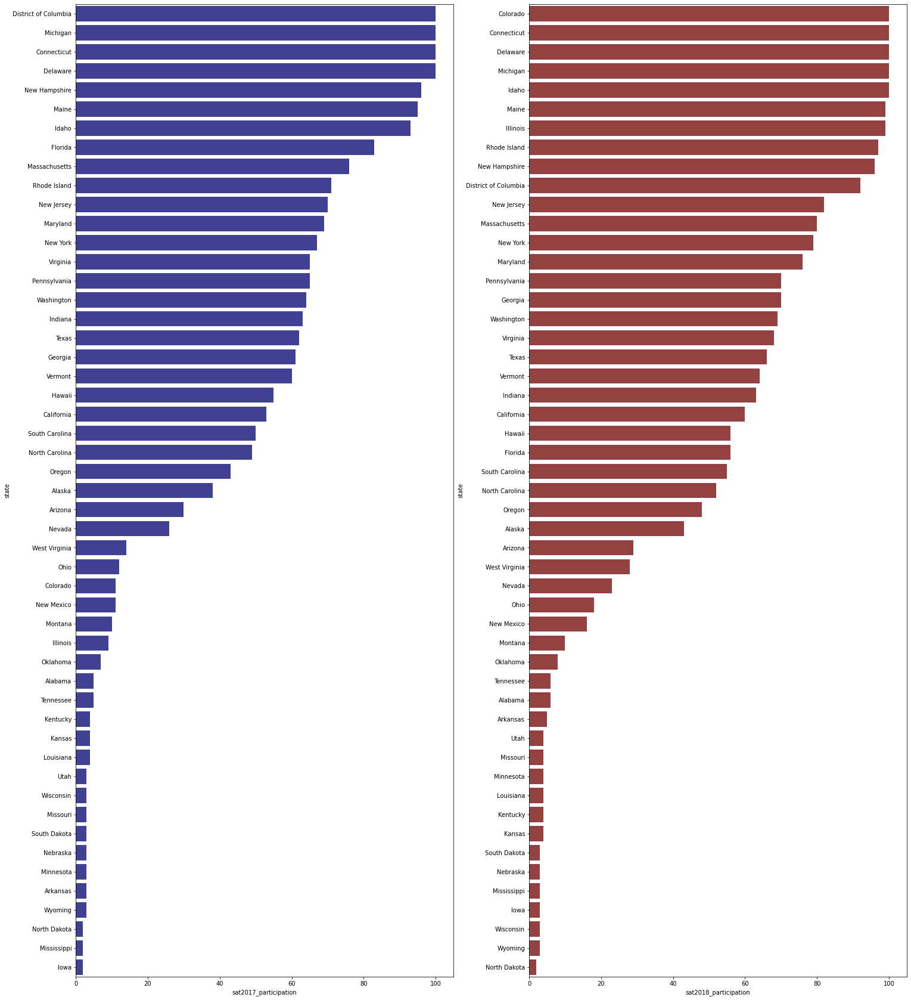

In [70]:
f, ax = plt.subplots(1,2,figsize=(25, 30))
final_p = final.sort_values(['sat2017_participation'],ascending=False).reset_index(drop=True)
sns.barplot(x=final_p['sat2017_participation'],y=final_p['state'],ax=ax[0], color = 'darkblue', alpha = 0.80);
final_p2018 = final.sort_values(['sat2018_participation'],ascending=False).reset_index(drop=True)
sns.barplot(x=final_p2018['sat2018_participation'],y=final_p2018['state'],ax=ax[1],color = 'darkred', alpha = 0.80);

### ACT Participation (%) by States (2017 vs 2018)  

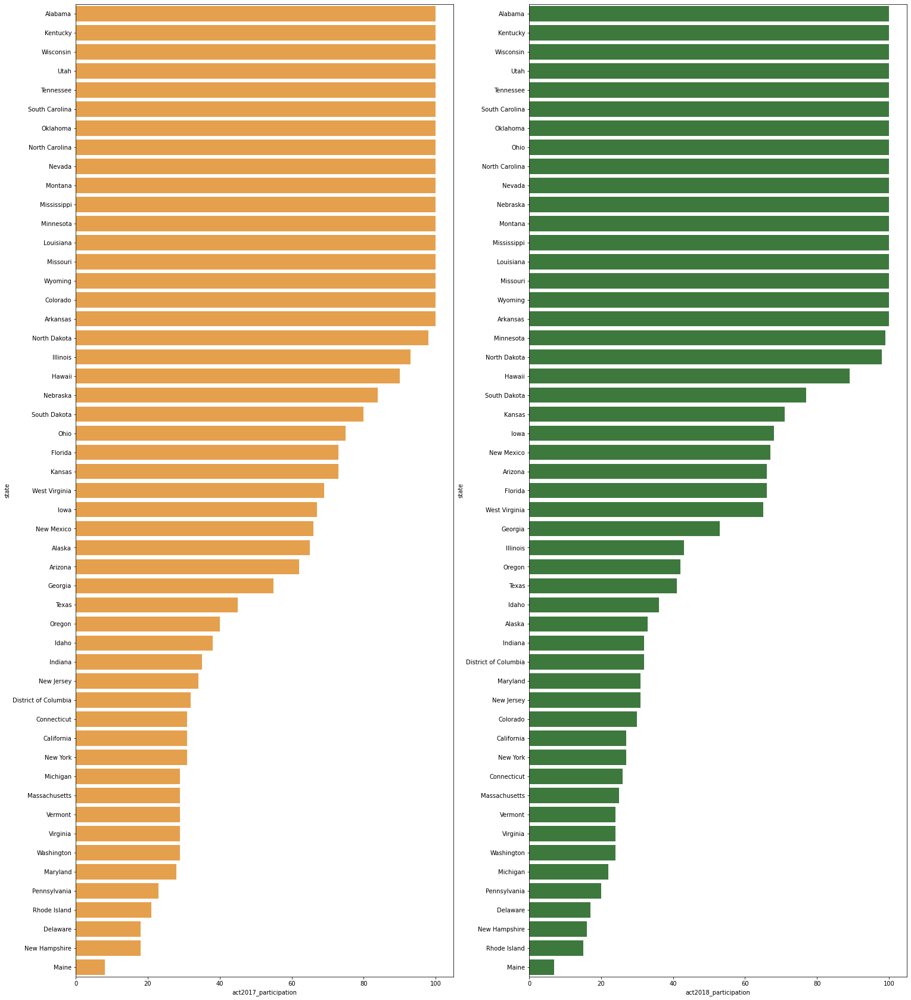

In [71]:
f, ax = plt.subplots(1,2,figsize=(25, 30))
final_p = final.sort_values(['act2017_participation'],ascending=False).reset_index(drop=True)
sns.barplot(x=final_p['act2017_participation'],y=final_p['state'],ax=ax[0], color = 'darkorange', alpha = 0.80);
final_p2018 = final.sort_values(['act2018_participation'],ascending=False).reset_index(drop=True)
sns.barplot(x=final_p2018['act2018_participation'],y=final_p2018['state'],ax=ax[1],color = 'darkgreen', alpha = 0.80);

In [72]:
# States with highest mean for Composite in ACT_2017
final.groupby('state')['act2017_composite'].mean().sort_values(ascending=False).head()

state
New Hampshire           25.5
Massachusetts           25.4
Connecticut             25.2
Maine                   24.3
District of Columbia    24.2
Name: act2017_composite, dtype: float64

In [73]:
# States with highest mean for Composite in ACT_2017
final.groupby('state')['act2018_composite'].mean().sort_values(ascending=False).head()

state
Connecticut      25.6
Massachusetts    25.5
New Hampshire    25.1
New York         24.5
Michigan         24.4
Name: act2018_composite, dtype: float64

In [74]:
# States with lowest mean for Composite in ACT_2017
final.groupby('state')['act2017_composite'].mean().sort_values(ascending=True).head()

state
Nevada            17.8
Mississippi       18.6
South Carolina    18.7
Hawaii            19.0
North Carolina    19.1
Name: act2017_composite, dtype: float64

In [75]:
# States with lowest mean for Composite in ACT_2018
final.groupby('state')['act2018_composite'].mean().sort_values(ascending=True).head()

state
Nevada            17.7
South Carolina    18.3
Mississippi       18.6
Hawaii            18.9
Alabama           19.1
Name: act2018_composite, dtype: float64

In [76]:
final['sat2017_total'].mean()

1126.0980392156862

In [77]:
# States with highest mean for Total in SAT_2017
final.groupby('state')['sat2017_total'].mean().sort_values(ascending=False).head()

state
Minnesota    1295
Wisconsin    1291
Iowa         1275
Missouri     1271
Kansas       1260
Name: sat2017_total, dtype: int64

In [78]:
# States with highest mean for Total in SAT_2018
final.groupby('state')['sat2018_total'].mean().sort_values(ascending=False).head()

state
Minnesota       1298
Wisconsin       1294
North Dakota    1283
Iowa            1265
Kansas          1265
Name: sat2018_total, dtype: int64

In [79]:
# States with lowest mean for Total in SAT_2017
final.groupby('state')['sat2017_total'].mean().sort_values(ascending=True).head()

state
District of Columbia     950
Delaware                 996
Idaho                   1005
Michigan                1005
Maine                   1012
Name: sat2017_total, dtype: int64

In [80]:
# States with lowest mean for Total in SAT_2018
final.groupby('state')['sat2018_total'].mean().sort_values(ascending=True).head()

state
District of Columbia     977
Delaware                 998
West Virginia            999
Idaho                   1001
Utah                    1010
Name: sat2018_total, dtype: int64

### ACT Average Composite Score by States (2017 vs 2018)  

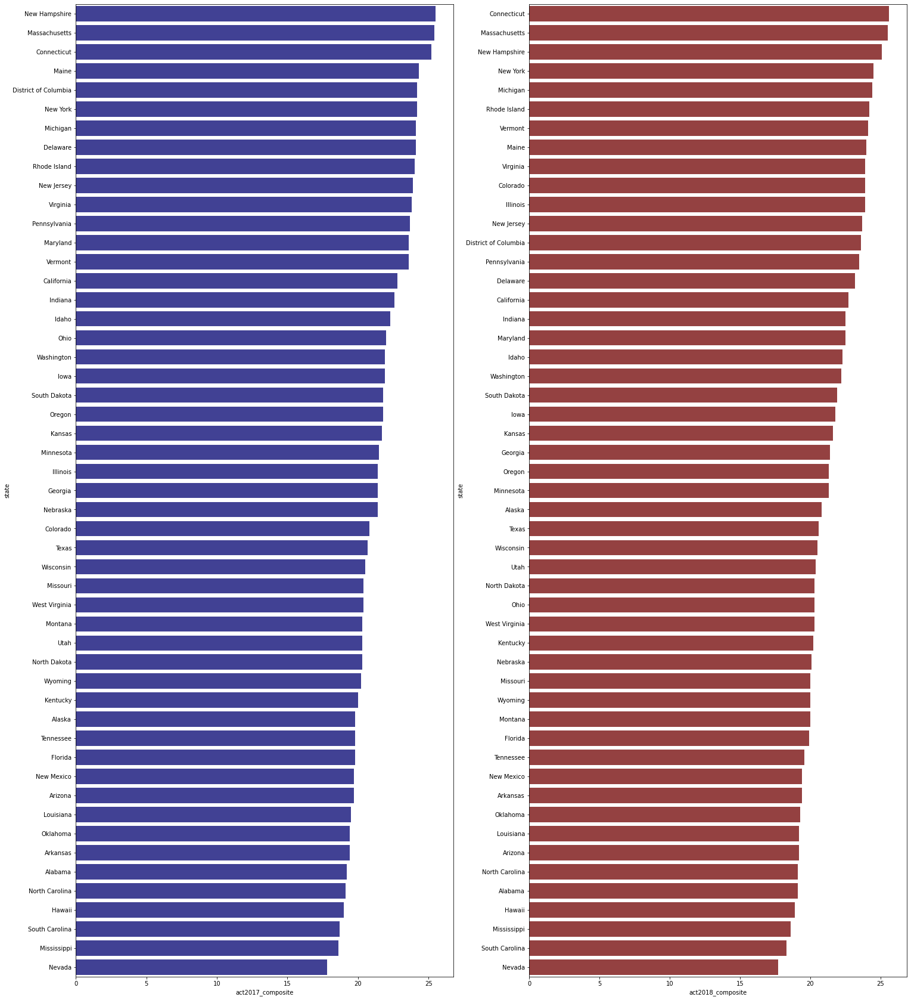

In [81]:
f, ax = plt.subplots(1,2,figsize=(25, 30))
final_c = final.sort_values(['act2017_composite'],ascending=False).reset_index(drop=True)
sns.barplot(x=final_c['act2017_composite'],y=final_c['state'],ax=ax[0], color = 'darkblue', alpha = 0.80);
final_c2018 = final.sort_values(['act2018_composite'],ascending=False).reset_index(drop=True)
sns.barplot(x=final_c2018['act2018_composite'],y=final_c2018['state'],ax=ax[1],color = 'darkred', alpha = 0.80);

### SAT Average Total Score by States (2017 vs 2018)  

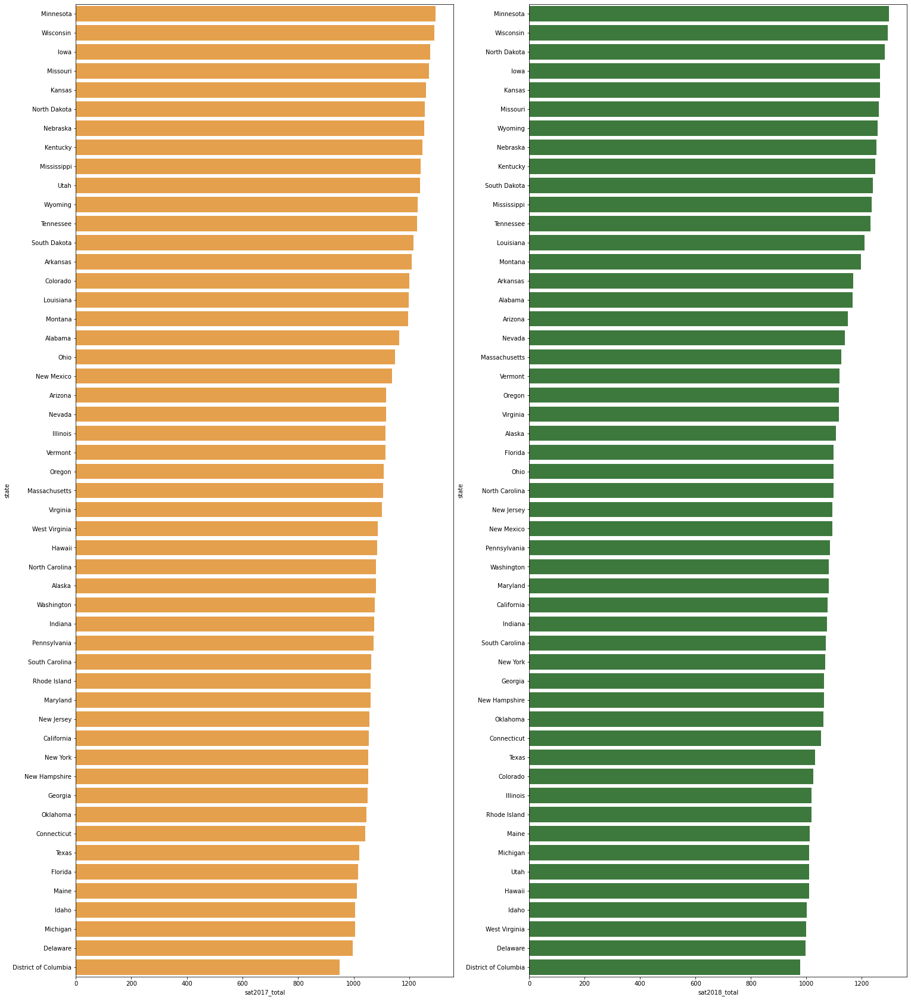

In [82]:
f, ax = plt.subplots(1,2,figsize=(25, 30))
final_t = final.sort_values(['sat2017_total'],ascending=False).reset_index(drop=True)
sns.barplot(x=final_t['sat2017_total'],y=final_t['state'],ax=ax[0], color = 'darkorange', alpha = 0.80);
final_t2018 = final.sort_values(['sat2018_total'],ascending=False).reset_index(drop=True)
sns.barplot(x=final_t2018['sat2018_total'],y=final_t2018['state'],ax=ax[1],color = 'darkgreen', alpha = 0.80);

Do any states with 100% participation on a given test have a rate change year-to-year?

- Yes, the state of Colorado 's participation rate in SAT increased from 11% to 100%, while its ACT participation decreased from 100% to 30% 

In [83]:
final[(final['sat2017_participation']==100) & (final['sat2018_participation']<100)][['state','sat2017_participation','sat2018_participation']]

,state,sat2017_participation,sat2018_participation
8,District of Columbia,100,92


In [84]:
final[(final['sat2018_participation']==100) & (final['sat2017_participation']<100)][['state','sat2017_participation','sat2018_participation']]

,state,sat2017_participation,sat2018_participation
5,Colorado,11,100
12,Idaho,93,100


In [85]:
final[(final['act2017_participation']==100) & (final['act2018_participation']<100)][['state','act2017_participation','act2018_participation']]

,state,act2017_participation,act2018_participation
5,Colorado,100,30
23,Minnesota,100,99


In [86]:
final[(final['act2018_participation']==100) & (final['act2017_participation']<100)][['state','act2017_participation','act2018_participation']]

,state,act2017_participation,act2018_participation
27,Nebraska,84,100
35,Ohio,75,100


Do any states show have >50% participation on *both* tests either year?

- Only 5 states fulfil the above criteria 

In [87]:
final[((final['sat2017_participation']>50) & (final['act2017_participation']>50)) | ((final['sat2018_participation']>50) & (final['act2018_participation']>50))][['state','sat2017_participation','sat2018_participation','act2017_participation','act2018_participation']].reset_index(drop=True)

,state,sat2017_participation,sat2018_participation,act2017_participation,act2018_participation
0,Florida,83,56,73,66
1,Georgia,61,70,55,53
2,Hawaii,55,56,90,89
3,North Carolina,49,52,100,100
4,South Carolina,50,55,100,100


#### Interesting observation: 
- The Colorado state 's SAT particpation rate in 2017 was 11% but in 2018, it increased to 100%, conversely it's ACT particpation rate dropped from 100% to 30%.
- In Florida, we notice a decline in the participation rate (-30%) for SAT test and (-10%) for the ACT test.

## Visualize the data

There's not a magic bullet recommendation for the right number of plots to understand a given dataset, but visualizing your data is *always* a good idea. Not only does it allow you to quickly convey your findings (even if you have a non-technical audience), it will often reveal trends in your data that escaped you when you were looking only at numbers.

Some recommendations on plotting:
- Plots have titles
- Plots have axis labels
- Plots have appropriate tick labels
- All text is legible in a plot
- Plots demonstrate meaningful and valid relationships
- Plots are interpreted to aid understanding

There is such a thing as too many plots, and there are a *lot* of bad plots. You might make some! (But hopefully not with the guided prompts below).

#### Use Seaborn's heatmap with pandas `.corr()` to visualize correlations between all numeric features

Heatmaps are generally not appropriate for presentations, and should often be excluded from reports as they can be visually overwhelming. **However**, they can be extremely useful in identify relationships of potential interest (as well as identifying potential collinearity before modeling).

*example*:
```python
sns.heatmap(df.corr())
```

Please take time to format your output, adding a title. Look through some of the additional arguments and options. (Axis labels aren't really necessary, as long as the title is informative).

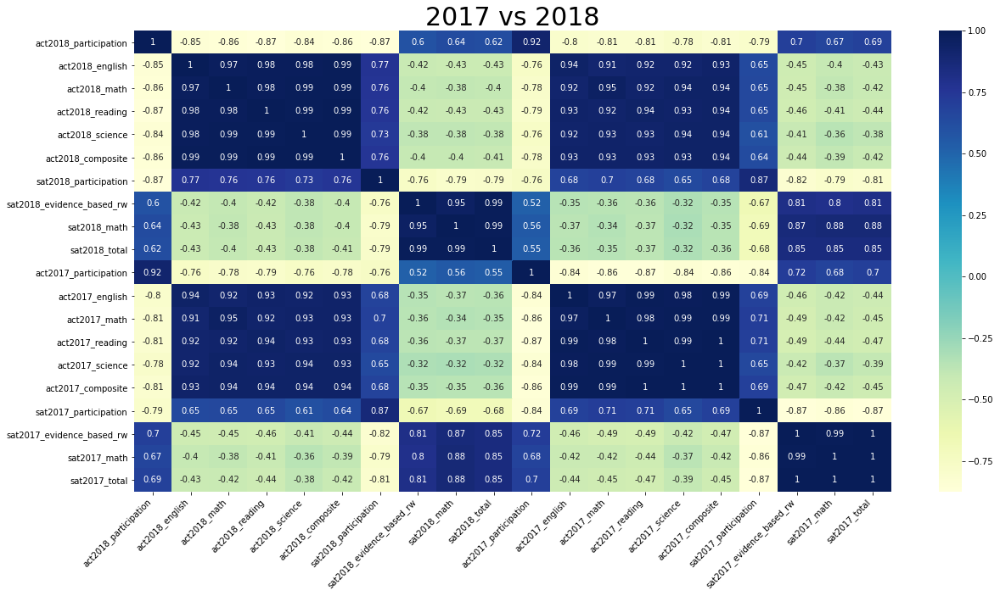

In [88]:
fig, ax = plt.subplots(figsize=(20,10))  
plt.title("2017 vs 2018", fontsize =30, loc='center')
d=sns.heatmap(final.corr(),ax=ax,annot=True,cmap="YlGnBu");
d.set_xticklabels(d.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

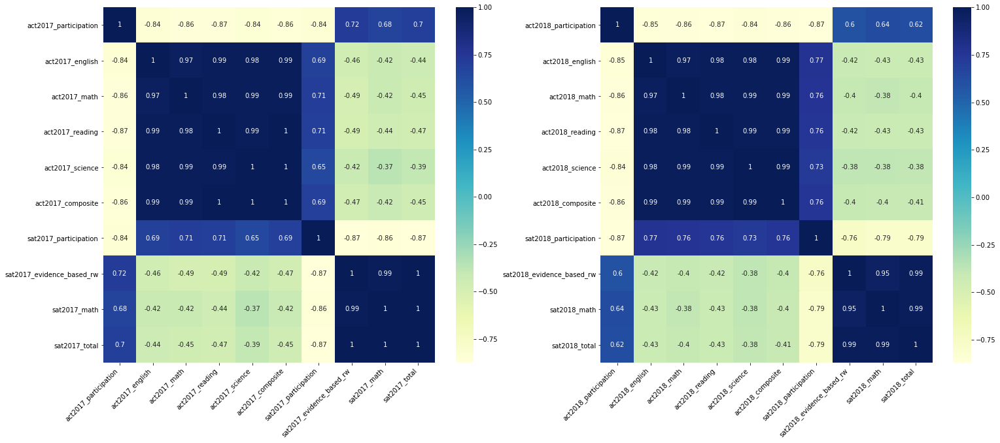

In [89]:
fig, ax = plt.subplots(1,2,figsize=(25,10))  
d=sns.heatmap(combined_2017.corr(),ax=ax[0],annot=True,cmap="YlGnBu");
d.set_xticklabels(d.get_xticklabels(), rotation=45, horizontalalignment='right')
d=sns.heatmap(combined_2018.corr(),ax=ax[1],annot=True,cmap="YlGnBu");
d.set_xticklabels(d.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

#### Define a custom function to subplot histograms

We have data for two tests for two years. We only have composite (and not subtest scores) for the 2018 ACT. We should write a function that will take the names of 2+ columns and subplot histograms. While you can use pandas plotting or Seaborn here, matplotlib gives you greater control over all aspects of your plots.

[Helpful Link for Plotting Multiple Figures](https://matplotlib.org/users/pyplot_tutorial.html#working-with-multiple-figures-and-axes)

Here's some starter code:

In [90]:
def subplot_histograms(dataframe, list_of_columns, list_of_titles, list_of_xlabels):
#def subplot_histograms(dataframe, list_of_columns, list_of_xlabels):
    nrows = int(np.ceil(len(list_of_columns)/2)) # Makes sure you have enough rows
    fig, ax = plt.subplots(nrows=nrows, ncols=2,figsize=(8,8)) # You'll want to specify your figsize
    ax = ax.ravel() # Ravel turns a matrix into a vector, which is easier to iterate
    for i, column in enumerate(list_of_columns): # Gives us an index value to get into all our lists
        ax[i].hist(dataframe[column], bins=30) # feel free to add more settings
        
        
    # Set titles, labels, etc here for each subplot
    for i, title in enumerate(list_of_titles): 
        ax[i].title.set_text(title)
    
    for i, label in enumerate(list_of_xlabels): 
        ax[i].set_xlabel(label)

#### Plot and interpret histograms 
For each of the following:
- Participation rates for SAT & ACT
- Math scores for SAT & ACT
- Reading/verbal scores for SAT & ACT

In [91]:
participation_rates=['act2017_participation','act2018_participation','sat2017_participation','sat2018_participation']
english_score=['act2017_english','act2018_english']
math_score=['act2017_math','act2018_math','sat2017_math','sat2018_math']

reading_verbal_score=['act2017_reading','act2018_reading','sat2017_evidence_based_rw','sat2018_evidence_based_rw']
science_score=['act2017_science','act2018_science']
composite_total_score=['act2017_composite','act2018_composite','sat2017_total','sat2018_total']



participation_title=['2017-ACT_Participation','2018-ACT_Participation','2017-SAT_Participation','2018-SAT_Participation']
english_title=['2017-ACT(English)','2018-ACT(English)']
math_title=['2017-ACT(Math)','2018-ACT(Math)','2017-SAT(Math)','2018-SAT(Math)']


reading_verbal_title=['2017-ACT(Reading)','2018-ACT(Reading)','2017-SAT_Evidence-Based Reading & Writing','2018-SAT_Evidence-Based Reading & Writing']


science_title=['2017-ACT(Science)','2018-ACT(Science)']
composite_total_title=['2017-ACT_Composite','2018-ACT_Composite','2017-SAT_Total','2018-SAT_Total']


labels_pct = ['(%)','(%)','(%)','(%)']
labels_score4 = ['score','score','score','score']
labels_score2 = ['score','score']

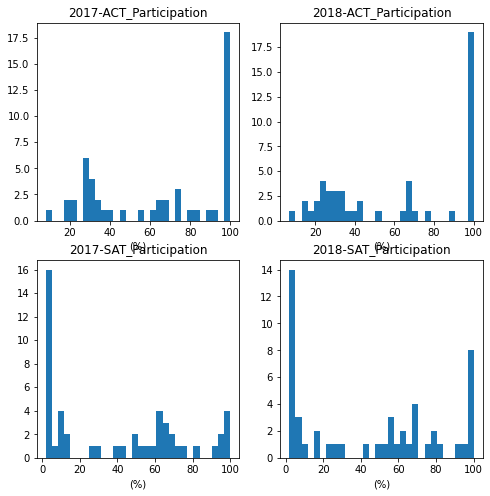

In [92]:
subplot_histograms(final,participation_rates,participation_title,labels_pct)

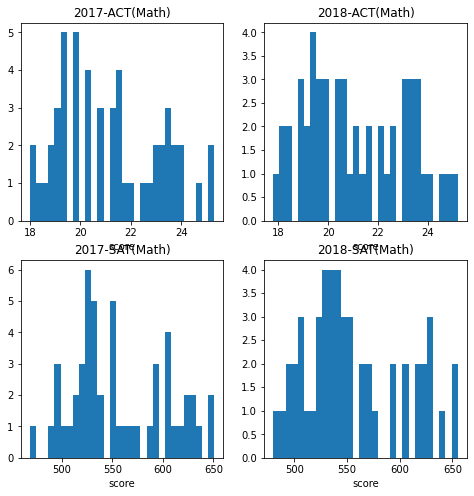

In [93]:
subplot_histograms(final,math_score,math_title,labels_score4)

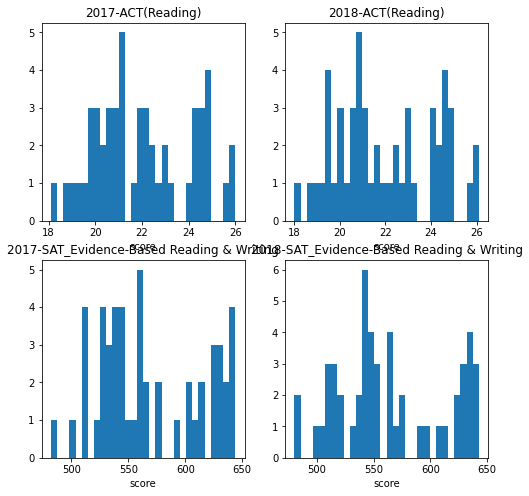

In [94]:
subplot_histograms(final,reading_verbal_score,reading_verbal_title,labels_score4)

#### Plot and interpret scatter plots

For each of the following:
- SAT vs. ACT math scores for 2017
- SAT vs. ACT verbal/reading scores for 2017
- SAT vs. ACT total/composite scores for 2017
- Total scores for SAT 2017 vs. 2018
- Composite scores for ACT 2017 vs. 2018

Plot the two variables against each other using matplotlib or Seaborn

Your plots should show:
- Two clearly labeled axes
- A proper title
- Using colors and symbols that are clear and unmistakable

**Feel free to write a custom function, and subplot if you'd like.** Functions save both time and space.


In [95]:
final.columns

Index(['state', 'act2018_participation', 'act2018_english', 'act2018_math',
       'act2018_reading', 'act2018_science', 'act2018_composite',
       'sat2018_participation', 'sat2018_evidence_based_rw', 'sat2018_math',
       'sat2018_total', 'act2017_participation', 'act2017_english',
       'act2017_math', 'act2017_reading', 'act2017_science',
       'act2017_composite', 'sat2017_participation',
       'sat2017_evidence_based_rw', 'sat2017_math', 'sat2017_total'],
      dtype='object')

In [96]:
def plot_scatter(sat_col,act_col):
    final.plot(kind='scatter',x=sat_col,y=act_col);
    plt.xlabel('SAT Scores');
    plt.ylabel('ACT Scores');
    
    return




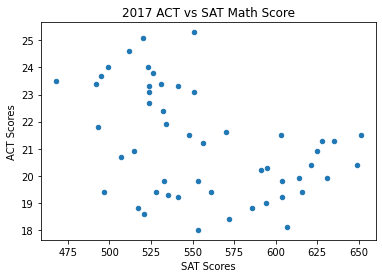

In [97]:
plot_scatter('sat2017_math','act2017_math')
plt.title('2017 ACT vs SAT Math Score');

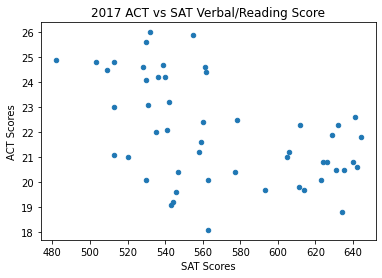

In [98]:
plot_scatter('sat2017_evidence_based_rw','act2017_reading')
plt.title('2017 ACT vs SAT Verbal/Reading Score');

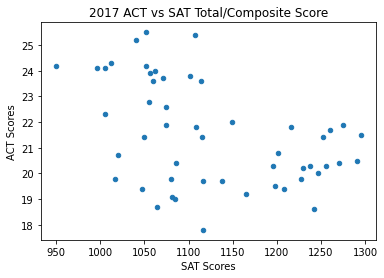

In [99]:
plot_scatter('sat2017_total','act2017_composite')
plt.title('2017 ACT vs SAT Total/Composite Score');

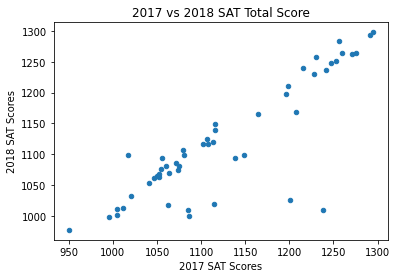

In [100]:
plot_scatter('sat2017_total','sat2018_total')
plt.title('2017 vs 2018 SAT Total Score');
plt.xlabel('2017 SAT Scores');
plt.ylabel('2018 SAT Scores');

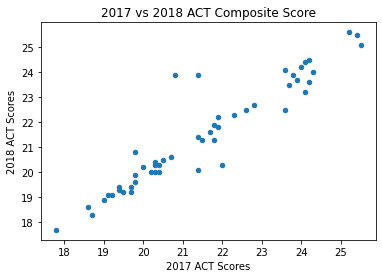

In [101]:
plot_scatter('act2017_composite','act2018_composite')
plt.title('2017 vs 2018 ACT Composite Score');
plt.xlabel('2017 ACT Scores');
plt.ylabel('2018 ACT Scores');

#### Observation:
- 2017 ACT vs SAT Math Score : no correlation
- 2017 ACT vs SAT Verbal/Reading Score : no correlation
- 2017 ACT vs SAT Total/Composite Score : no correlation
- 2017 vs 2018 SAT Total Score : positive correlation
- 2017 vs 2018 ACT Composite Score : positive correlation

#### Plot and interpret boxplots

For each numeric variable in the dataframe create a boxplot using Seaborn. Boxplots demonstrate central tendency and spread in variables. In a certain sense, these are somewhat redundant with histograms, but you may be better able to identify clear outliers or differences in IQR, etc.

Multiple values can be plotted to a single boxplot as long as they are of the same relative scale (meaning they have similar min/max values).

Each boxplot should:
- Only include variables of a similar scale
- Have clear labels for each variable
- Have appropriate titles and labels

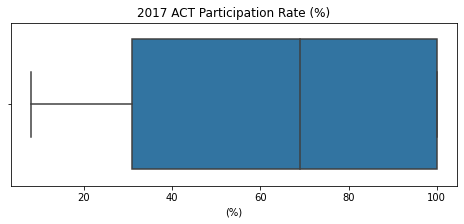

In [102]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2017_participation'],orient='h');
plt.title('2017 ACT Participation Rate (%)');
plt.xlabel('(%)');

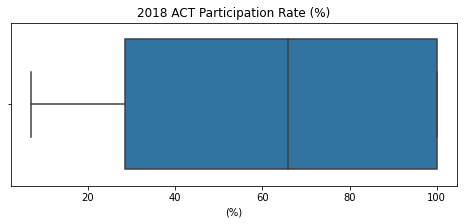

In [103]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2018_participation'],orient='h');
plt.title('2018 ACT Participation Rate (%)');
plt.xlabel('(%)');

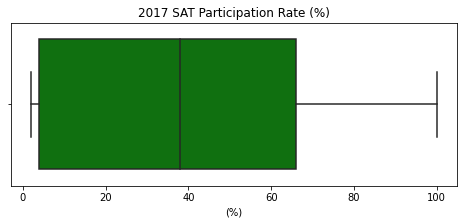

In [104]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['sat2017_participation'],orient='h',color='green');
plt.title('2017 SAT Participation Rate (%)');
plt.xlabel('(%)');

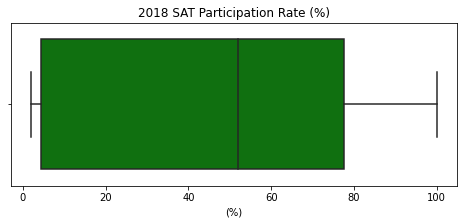

In [105]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['sat2018_participation'],orient='h',color='green');
plt.title('2018 SAT Participation Rate (%)');
plt.xlabel('(%)');

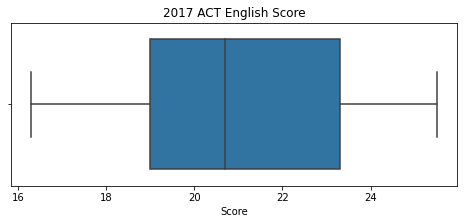

In [106]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2017_english'],orient='h');
plt.title('2017 ACT English Score');
plt.xlabel('Score');

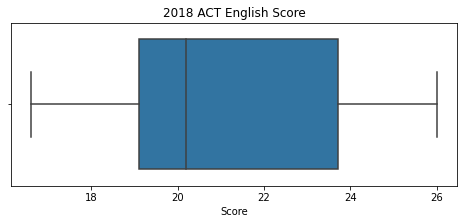

In [107]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2018_english'],orient='h');
plt.title('2018 ACT English Score');
plt.xlabel('Score');

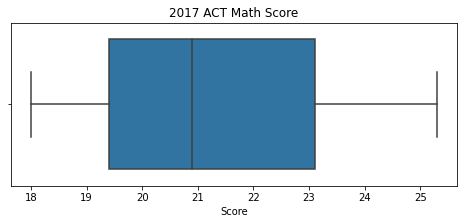

In [108]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2017_math'],orient='h');
plt.title('2017 ACT Math Score');
plt.xlabel('Score');

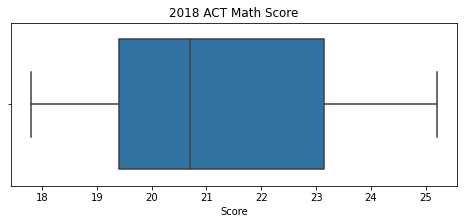

In [109]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2018_math'],orient='h');
plt.title('2018 ACT Math Score');
plt.xlabel('Score');

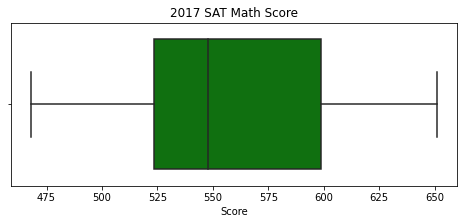

In [110]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['sat2017_math'],orient='h',color='green');
plt.title('2017 SAT Math Score');
plt.xlabel('Score');

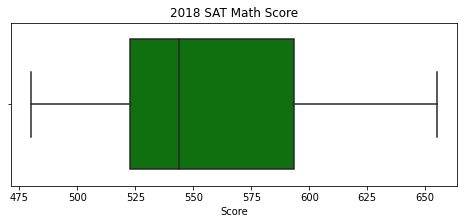

In [111]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['sat2018_math'],orient='h',color='green');
plt.title('2018 SAT Math Score');
plt.xlabel('Score');

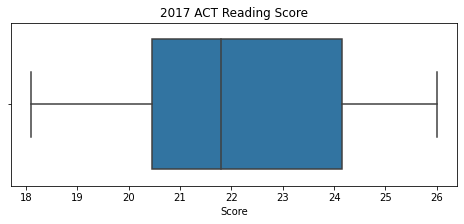

In [112]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2017_reading'],orient='h');
plt.title('2017 ACT Reading Score');
plt.xlabel('Score');

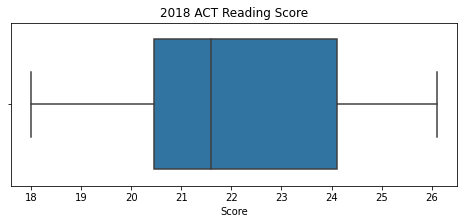

In [113]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2018_reading'],orient='h');
plt.title('2018 ACT Reading Score');
plt.xlabel('Score');

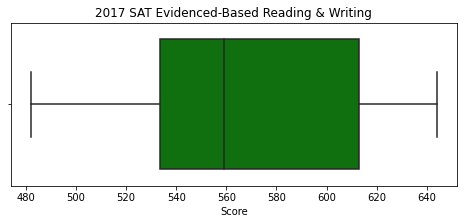

In [114]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['sat2017_evidence_based_rw'],orient='h',color='green');
plt.title('2017 SAT Evidenced-Based Reading & Writing');
plt.xlabel('Score');

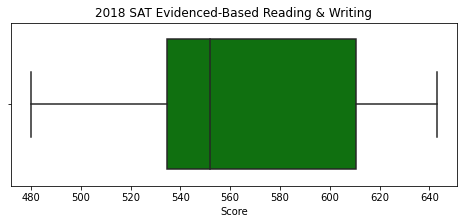

In [115]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['sat2018_evidence_based_rw'],orient='h',color='green');
plt.title('2018 SAT Evidenced-Based Reading & Writing');
plt.xlabel('Score');

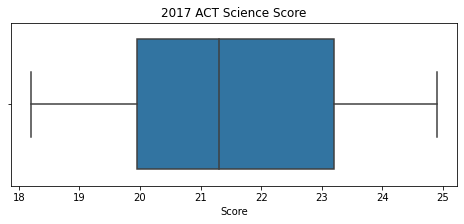

In [116]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2017_science'],orient='h');
plt.title('2017 ACT Science Score');
plt.xlabel('Score');

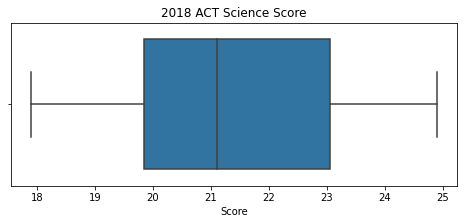

In [117]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2018_science'],orient='h');
plt.title('2018 ACT Science Score');
plt.xlabel('Score');

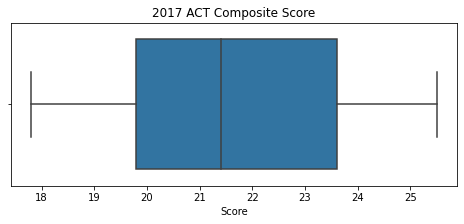

In [118]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2017_composite'],orient='h');
plt.title('2017 ACT Composite Score');
plt.xlabel('Score');

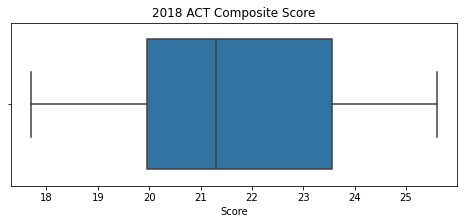

In [119]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['act2018_composite'],orient='h');
plt.title('2018 ACT Composite Score');
plt.xlabel('Score');

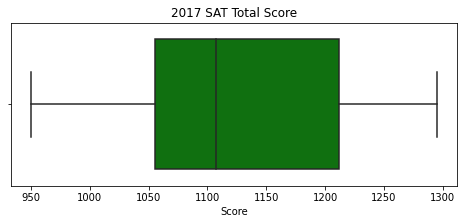

In [120]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['sat2017_total'],orient='h',color='green');
plt.title('2017 SAT Total Score');
plt.xlabel('Score');

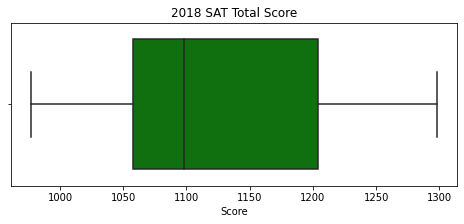

In [121]:
fig, ax = plt.subplots(figsize=(8,3))  
sns.boxplot(x=final['sat2018_total'],orient='h',color='green');
plt.title('2018 SAT Total Score');
plt.xlabel('Score');

#### Feel free to do additional plots below
*(do research and choose your own chart types & variables)*

Are there any additional trends or relationships you haven't explored? Was there something interesting you saw that you'd like to dive further into? It's likely that there are a few more plots you might want to generate to support your narrative and recommendations that you are building toward. **As always, make sure you're interpreting your plots as you go**.

### We run the plot for participation rates vs the scores for  both Act 2018 and SAT 2018 for each state.

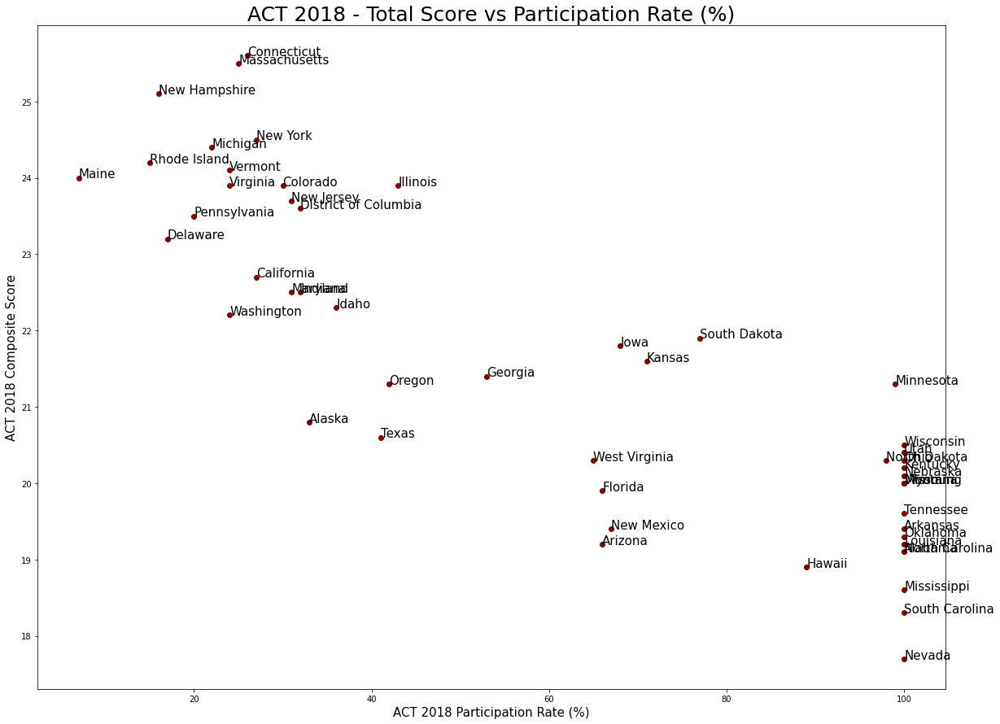

In [122]:
z = final['act2018_participation']
y = final['act2018_composite']
n = final['state']
fig, ax = plt.subplots(figsize = (20,15))
ax.scatter(z, y,color="darkred")
_ = plt.xlabel('ACT 2018 Participation Rate (%)',fontsize=15)
_ = plt.ylabel('ACT 2018 Composite Score',fontsize=15)
_ = plt.title('ACT 2018 - Total Score vs Participation Rate (%)',fontsize=25)


for i, txt in enumerate(n):
    ax.annotate(txt, (z[i],y[i]),fontsize=15)
plt.show()

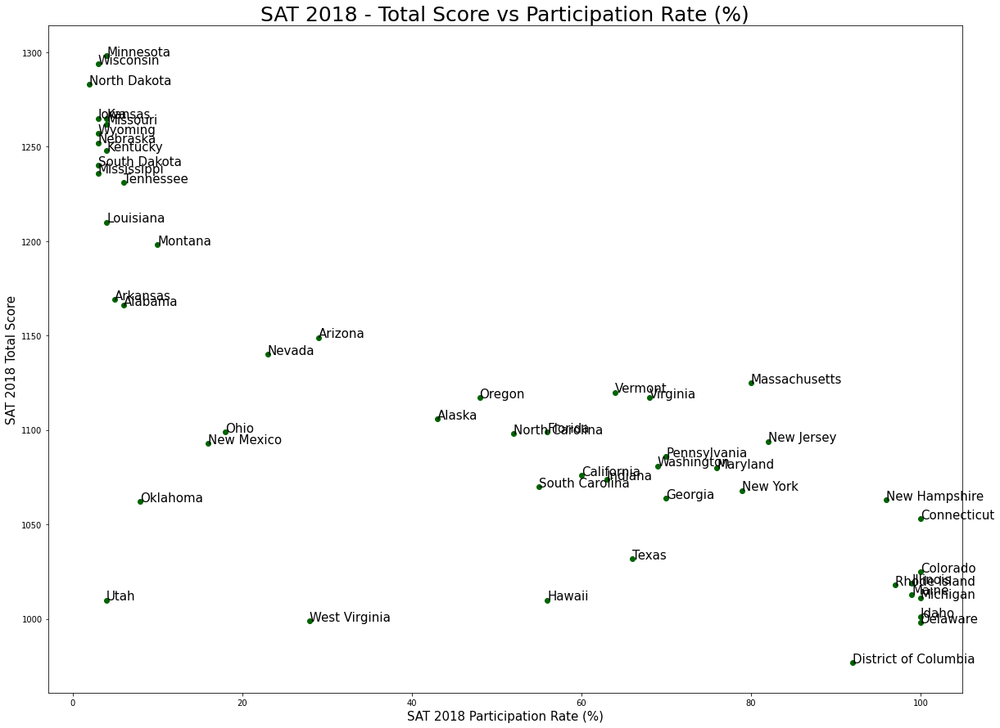

In [123]:
z = final['sat2018_participation']
y = final['sat2018_total']
n = final['state']
fig, ax = plt.subplots(figsize = (20,15))
ax.scatter(z, y,color="darkgreen")
_ = plt.xlabel('SAT 2018 Participation Rate (%)',fontsize=15)
_ = plt.ylabel('SAT 2018 Total Score',fontsize=15)
_ = plt.title('SAT 2018 - Total Score vs Participation Rate (%)',fontsize=25)


for i, txt in enumerate(n):
    ax.annotate(txt, (z[i],y[i]),fontsize=15)
plt.show()

####  For further review, we chose the following states where 

 - the 2018 SAT participation rate < 50% and total SAT score > mean of SAT score in 2018
 - and composite score for ACT is less than 1 SD of the mean of ACT composite score in 2018   

In [124]:
review=final[(final['sat2018_participation']<50) & (final['sat2018_total']>np.mean(final['sat2018_total'])) & (final['act2018_composite']<np.mean(final['act2018_composite'])-np.std(final['act2018_composite']))][['state','sat2018_participation','sat2018_total','act2018_participation','act2018_composite']].reset_index(drop=True)
review.sort_values('sat2018_total', ascending=False).reset_index(drop=True)

,state,sat2018_participation,sat2018_total,act2018_participation,act2018_composite
0,Mississippi,3,1236,100,18.6
1,Louisiana,4,1210,100,19.2
2,Arkansas,5,1169,100,19.4
3,Alabama,6,1166,100,19.1
4,Arizona,29,1149,66,19.2
5,Nevada,23,1140,100,17.7


### We then plot a scatterplot comparing the 2018 participation rates for SAT vs ACT in each state 

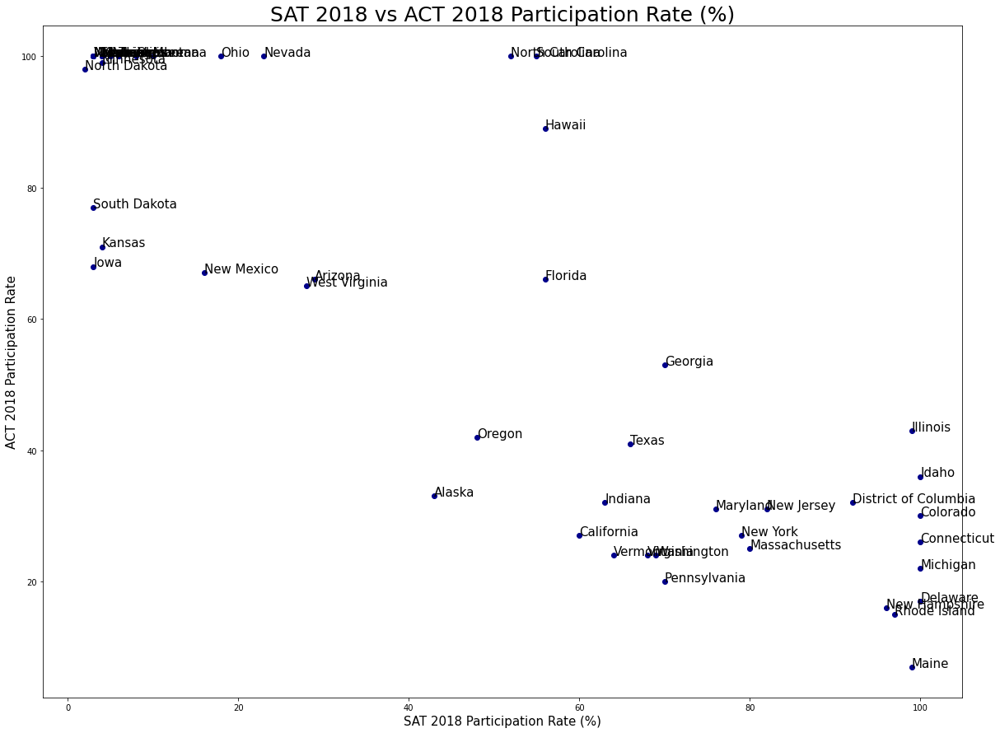

In [125]:
z = final['sat2018_participation']
y = final['act2018_participation']
n = final['state']
fig, ax = plt.subplots(figsize = (20,15))
ax.scatter(z, y,color="darkblue")
_ = plt.xlabel('SAT 2018 Participation Rate (%)',fontsize=15)
_ = plt.ylabel('ACT 2018 Participation Rate',fontsize=15)
_ = plt.title('SAT 2018 vs ACT 2018 Participation Rate (%)',fontsize=25)


for i, txt in enumerate(n):
    ax.annotate(txt, (z[i],y[i]),fontsize=15)
plt.show()

In [126]:
states_r=final.loc[final['state'].isin(['Mississippi','Louisiana','Arkansas'])]
sat_2018_r=states_r.loc[:,['state','sat2018_participation','sat2018_evidence_based_rw', 'sat2018_math','sat2018_total']]
act_2018_r=states_r.loc[:,['state','act2018_participation','act2018_english', 'act2018_math','act2018_reading', 'act2018_science','act2018_composite']]

In [127]:
sat_2018_r

,state,sat2018_participation,sat2018_evidence_based_rw,sat2018_math,sat2018_total
3,Arkansas,5,592,576,1169
18,Louisiana,4,615,595,1210
24,Mississippi,3,630,606,1236


In [128]:
act_2018_r

,state,act2018_participation,act2018_english,act2018_math,act2018_reading,act2018_science,act2018_composite
3,Arkansas,100,19.1,18.9,19.7,19.4,19.4
18,Louisiana,100,19.0,18.5,19.6,19.1,19.2
24,Mississippi,100,18.2,18.1,18.9,18.6,18.6


#### Observation:
- The above states are selected for further analysis

#### (Optional): Using Tableau, create a choropleth map for each variable using a map of the US. 

Save this plot as an image file in an images directory, provide a relative path, and insert the image into notebook in markdown.

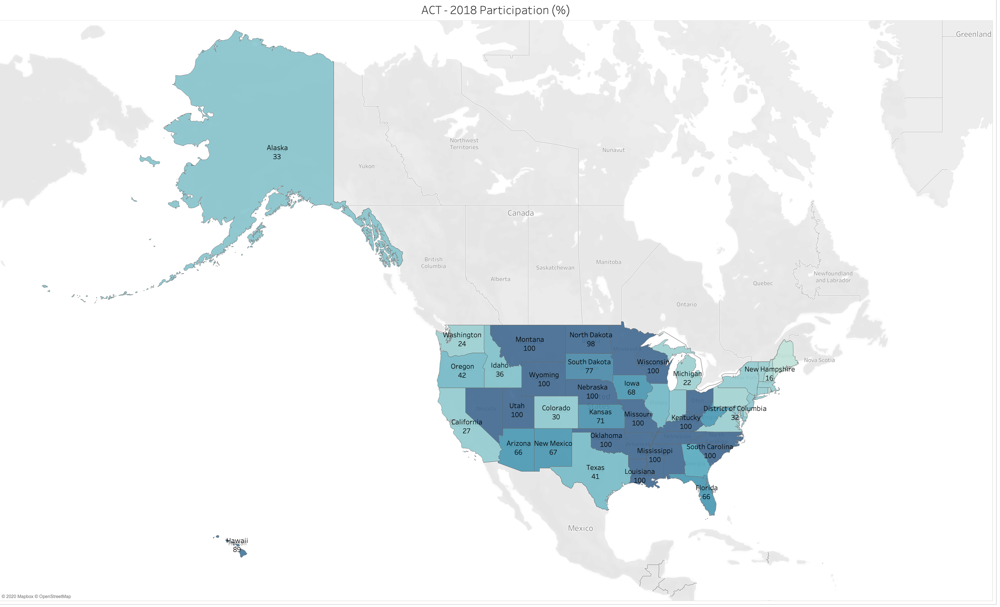

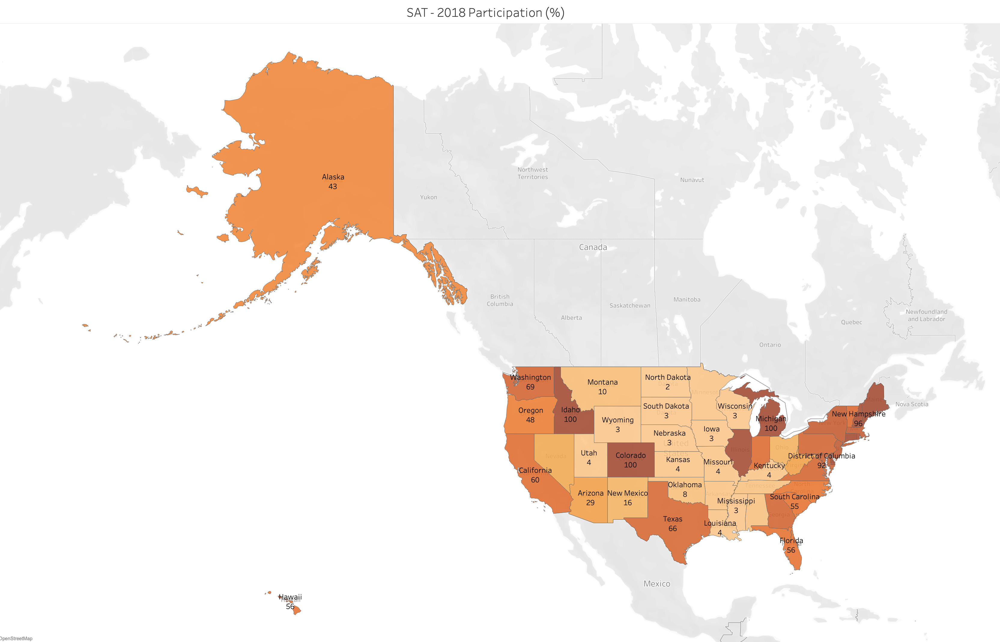

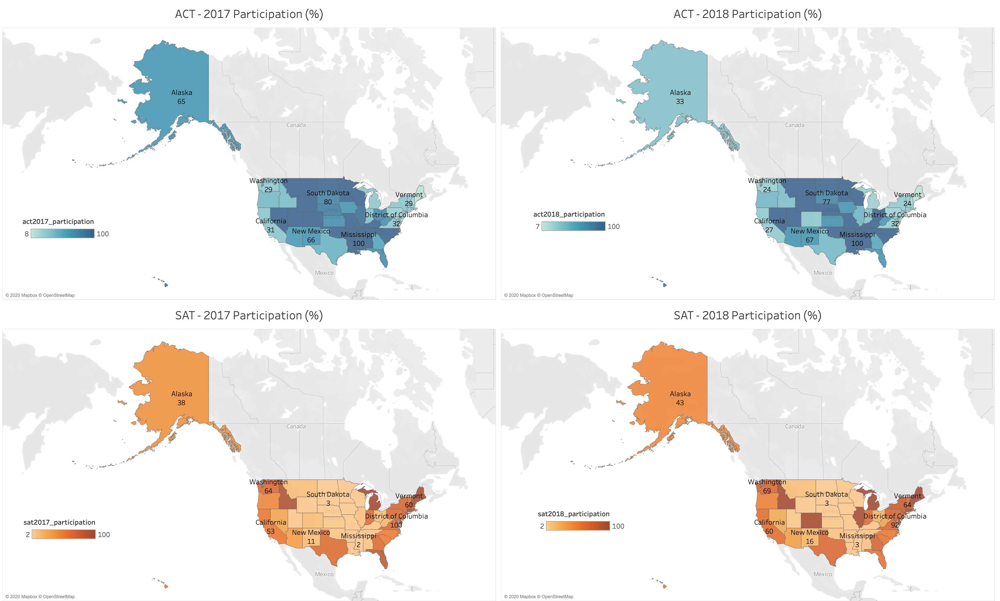

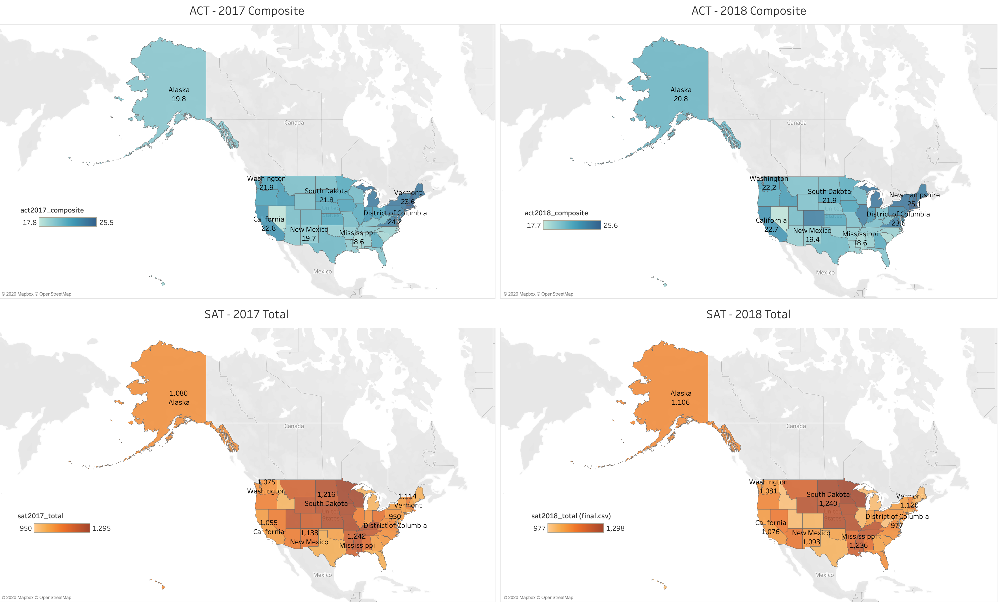

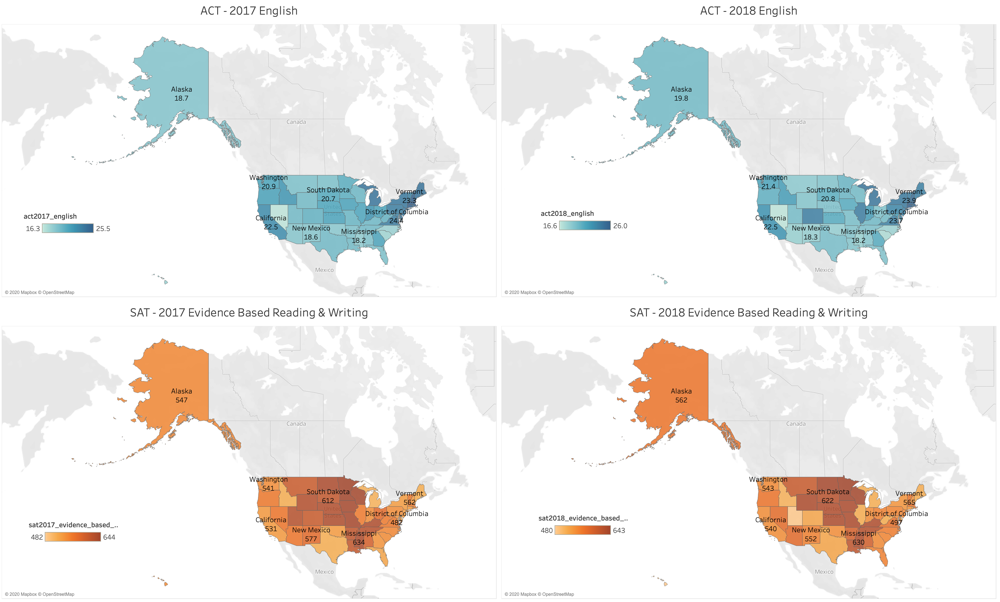

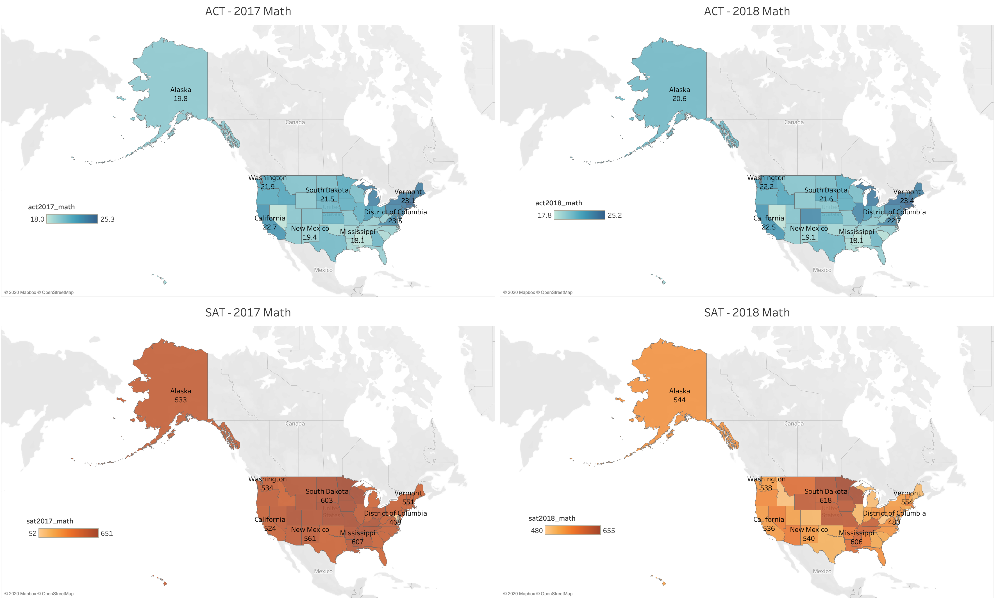

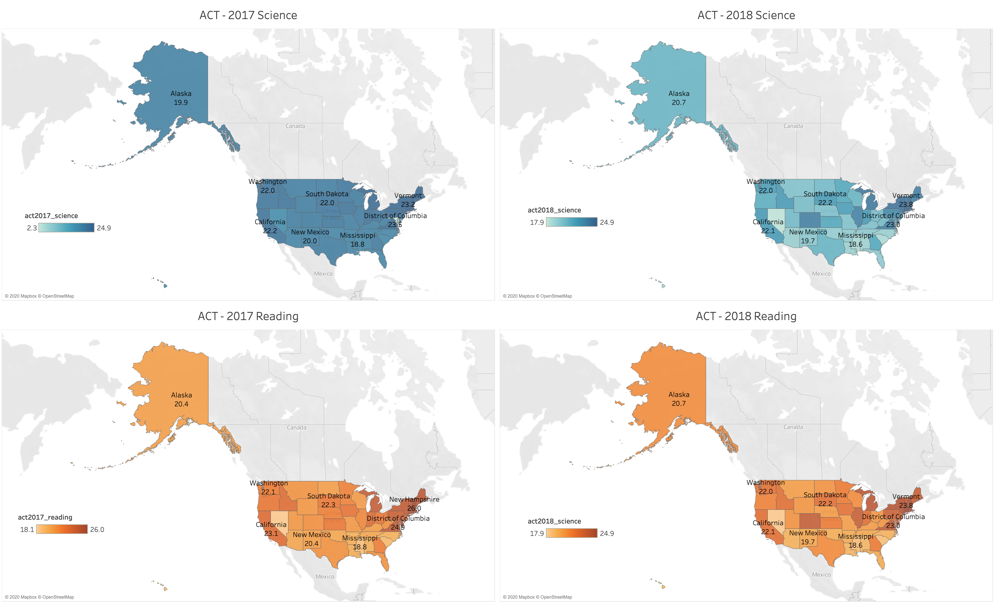

## Descriptive and Inferential Statistics

#### Summarizing Distributions

Above, we used pandas `describe` to provide quick summary statistics of our numeric columns. We also demonstrated many visual relationships.

As data scientists, having a complete understanding of data is imperative prior to modeling.

While we will continue to build our analytic tools, we know that measures of *central tendency*, *spread*, and *shape/skewness* provide a quick summary of distributions.

For each variable in your data, summarize the underlying distributions (in words & statistics)
 - Be thorough in your verbal description of these distributions.
 - Be sure to back up these summaries with statistics.

Answers:

#### ACT Participation rate:

- 2018:

    - Centre
        - Mean participation rate is 61.65%
        - Median participate rate is 66%
        - Mode is 100% with 17 occurences
    - Spread
        - Standard deviation is 34 (data values are widely spread out from the mean)
        - Range is between 7% to 100% 
        - Interquartile range is 71.5
    - Shape
        - left skewed 
        - Not a normal distrinution

- 2017:

    - Centre
        - Mean participation rate is 62.25%
        - Median participate rate is 69%
        - Mode is 100% with 17 occurences
    - Spread
        - Standard deviation is 32 (data values are widely spread out from the mean)
        - Range is between 8% to 100% 
        - Interquartile range is 69
    - Shape
        - left skewed 
        - Not a normal distrinution

#### SAT Participation rate:

- 2018:

    - Centre
        - Mean participation rate is 45.75%
        - Median participate rate is 52%
        - Mode is 3% with 6 occurences
    - Spread
        - Standard deviation is 37.31 (data values are widely spread out from the mean)
        - Range is between 2% to 100% 
        - Interquartile range is 73
    - Shape
        - right skewed 
        - Not a normal distrinution

- 2017:

    - Centre
        - Mean participation rate is 39.8%
        - Median participate rate is 38%
        - Mode is 3% with 8 occurences
    - Spread
        - Standard deviation is 35.3 (data values are widely spread out from the mean)
        - Range is between 2% to 100% 
        - Interquartile range is 62
    - Shape
        - right skewed
        - Not a normal distrinution

#### ACT English Score:

- 2018:

    - Centre
        - Mean English Score is 20.99
        - Median English Score is 20.20
        - Mode is 18.2 with 3 occurences
    - Spread
        - Standard deviation is 2.45 
        - Range is between 16.6 to 26 
        - Interquartile range is 4.6
    - Shape
        - right skewed
        - bimodal distribution

- 2017:

    - Centre
        - Mean English Score is 20.93
        - Median English Score is 20.70
        - Mode is 19 with 3 occurences
    - Spread
        - Standard deviation is 2.35 
        - Range is between 16.3 to 25.5 
        - Interquartile range is 4.3
    - Shape
        - right skewed
        - bimodal distribution

#### ACT Math Score:

- 2018:

    - Centre
        - Mean Math Score is 21.13
        - Median Math Score is 20.70
        - Mode is 19.7 with 3 occurences
    - Spread
        - Standard deviation is 2.04 
        - Range is between 17.8 to 25.2 
        - Interquartile range is 3.75
    - Shape
        - right skewed
        - bimodal distribution

- 2017:

    - Centre
        - Mean Math Score is 21.18
        - Median Math Score is 20.90
        - Mode is 19.4 with 4 occurences
    - Spread
        - Standard deviation is 1.98 
        - Range is between 18 to 25.3 
        - Interquartile range is 3.7
    - Shape
        - right skewed
        - bimodal distribution

#### SAT Math Score:

- 2018:

    - Centre
        - Mean Math Score is 556.24
        - Median Math Score is 544
        - Mode is 506 with 2 occurences
    - Spread
        - Standard deviation is 47.774 
        - Range is between 480 to 655 
        - Interquartile range is 71
    - Shape
        - right skewed
        - bimodal distribution

- 2017:

    - Centre
        - Mean Math Score is 556.88
        - Median Math Score is 548
        - Mode is 524 with 3 occurences
    - Spread
        - Standard deviation is 47.12 
        - Range is between 468 to 651 
        - Interquartile range is 75.5
    - Shape
        - right skewed
        - bimodal distribution

#### ACT Reading Score:

- 2018:

    - Centre
        - Mean Reading Score is 22.02
        - Median Reading Score is 21.60
        - Mode is 24.7 with 3 occurences
    - Spread
        - Standard deviation is 2.17 
        - Range is between 18 to 26.1 
        - Interquartile range is 3.65
    - Shape
        - right skewed
        - bimodal distribution

- 2017:

    - Centre
        - Mean Reading Score is 22.01
        - Median Reading Score is 21.8
        - Mode is 20.1 with 3 occurences
    - Spread
        - Standard deviation is 2.07 
        - Range is between 18.1 to 26 
        - Interquartile range is 3.7
    - Shape
        - right skewed
        - bimodal distribution

#### ACT Science Score:

- 2018:

    - Centre
        - Mean Science Score is 21.35
        - Median Science Score is 21.10
        - Mode is 22.2 with 3 occurences
    - Spread
        - Standard deviation is 1.87 
        - Range is between 17.9 to 24.9 
        - Interquartile range is 3.2
    - Shape
        - right skewed
        - bimodal distribution

- 2017:

    - Centre
        - Mean Science Score is 21.45
        - Median Science Score is 21.3
        - Mode is 20.5 with 3 occurences
    - Spread
        - Standard deviation is 1.74 
        - Range is between 18.2 to 24.9 
        - Interquartile range is 3.25
    - Shape
        - right skewed
        - bimodal distribution

#### SAT Evidence Based Read Write Score:

- 2018:

    - Centre
        - Mean Evident-based R/W Score is 563.69
        - Median Evident-based R/W Score is 552
        - Mode is 513 with 3 occurences
    - Spread
        - Standard deviation is 47.5 
        - Range is between 480 to 643 
        - Interquartile range is 67
    - Shape
        - right skewed
        - bimodal distribution

- 2017:

    - Centre
        - Mean Evident-based R/W Score is 569.12
        - Median Evident-based R/W Score is 559
        - Mode is 513 with 3 occurences
    - Spread
        - Standard deviation is 45.67 
        - Range is between 482 to 644 
        - Interquartile range is 79.5
    - Shape
        - right skewed
        - bimodal distribution

#### ACT Composite Score:

- 2018:

    - Centre
        - Mean Composite Score is 21.49
        - Median Composite Score is 21.3
        - Mode is 20 with 3 occurences
    - Spread
        - Standard deviation is 2.11 
        - Range is between 17.7 to 25.6 
        - Interquartile range is 3.6
    - Shape
        - right skewed
        - bimodal distribution

- 2017:

    - Centre
        - Mean Composite Score is 21.52
        - Median Composite Score is 21.4
        - Mode is 19.8 with 3 occurences
    - Spread
        - Standard deviation is 2.02 
        - Range is between 17.8 to 25.5 
        - Interquartile range is 3.8
    - Shape
        - right skewed
        - bimodal distribution


#### SAT Total Score:

- 2018:

    - Centre
        - Mean Total Score is 1120
        - Median Total Score is 1098
        - Mode is 1010 with 2 occurences
    - Spread
        - Standard deviation is 94.16 
        - Range is between 977 to 1298 
        - Interquartile range is 146.5
    - Shape
        - right skewed
        - bimodal distribution

- 2017:

    - Centre
        - Mean Total Score is 1126.1
        - Median Total Score is 1107
        - Mode is 1005 with 2 occurences
    - Spread
        - Standard deviation is 92.49 
        - Range is between 950 to 1295 
        - Interquartile range is 157
    - Shape
        - right skewed
        - bimodal distribution

In [129]:
final.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
act2018_participation,51.0,61.647059,34.080976,7.0,28.50,66.0,100.00,100.0
act2018_english,51.0,20.988235,2.446356,16.6,19.10,20.2,23.70,26.0
act2018_math,51.0,21.125490,2.035765,17.8,19.40,20.7,23.15,25.2
act2018_reading,51.0,22.015686,2.167245,18.0,20.45,21.6,24.10,26.1
act2018_science,51.0,21.345098,1.870114,17.9,19.85,21.1,23.05,24.9
act2018_composite,51.0,21.486275,2.106278,17.7,19.95,21.3,23.55,25.6
sat2018_participation,51.0,45.745098,37.314256,2.0,4.50,52.0,77.50,100.0
sat2018_evidence_based_rw,51.0,563.686275,47.502627,480.0,534.50,552.0,610.50,643.0
sat2018_math,51.0,556.235294,47.772623,480.0,522.50,544.0,593.50,655.0
sat2018_total,51.0,1120.019608,94.155083,977.0,1057.50,1098.0,1204.00,1298.0


In [130]:
stats.mode(final['sat2017_total'])

ModeResult(mode=array([1005]), count=array([2]))


#### Distributions in the data

In this dataset, each data represents a sample from a population.                        
For example, for ACT math test:
- Population: the test results of all the students who take this test, nation-wide.
- Population mean: is the national average of ACT math test (total scores/total no. of test takers) 
- Sample: the state means of ACT math test. We have 51 samples (51 states)

***According to CLT, we generally assuming that data we sample from a population will be normally distributed. Do we observe this trend?***

Answer: No, almost all of the test results are not normally distributed.

Does This Assumption Hold for:
    - Math
    - Reading
    - Rates
Explain your answers for each distribution and how you think this will affect estimates made from these data.

Answer: 

- The sample collected for each test (Math/Reading) from each state consist of 2 groups of students - prepared and unprepared for the tests. 
- Thus causing the bimodal distribution. 

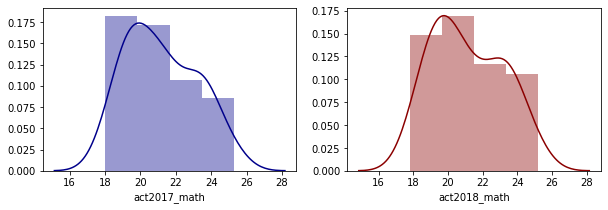

In [131]:
f, ax = plt.subplots(1,2,figsize=(10, 3))
sns.distplot(final['act2017_math'], ax=ax[0],color = 'darkblue');
sns.distplot(final['act2018_math'],ax=ax[1],color = 'darkred');

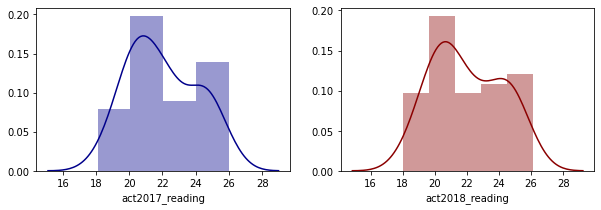

In [132]:
f, ax = plt.subplots(1,2,figsize=(10, 3))
sns.distplot(final['act2017_reading'], ax=ax[0],color = 'darkblue');
sns.distplot(final['act2018_reading'],ax=ax[1],color = 'darkred');

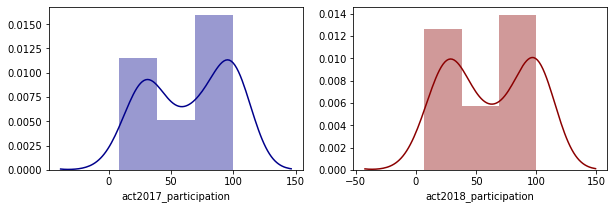

In [133]:
f, ax = plt.subplots(1,2,figsize=(10, 3))
sns.distplot(final['act2017_participation'], ax=ax[0],color = 'darkblue');
sns.distplot(final['act2018_participation'],ax=ax[1],color = 'darkred');

#### Estimate Limits of Data

Suppose we only seek to understand the relationship between SAT and ACT participation rates in 2017. 

##### Does it make sense to conduct statistical inference given these data specifically? 

Why or why not?

*(think about granularity, aggregation, the relationships between populations size & rates...consider the actually populations these data describe in answering this question)*

No, SAT and ACT have different test measurements and also in each state, the test participation is affected by the state policy.

##### Is it appropriate to compare *these* specific SAT and ACT math scores  - can we say students with higher SAT math score is better than those with lower ACT math score, or vice versa?

Why or why not?

Answer: 
- No, because SAT and ACT are 2 different test organisations.
- Also, the testing requirments are different for both tests. eg timing and the format/structure for each topic
- SAT's math features more word problems while ACT incorporates higher level math concepts
- Calculators are allowed for all ACT Math questions while for SAT, there is a section where calculator isn;t allowed
- So it is not a fair comparision to say that students with higher SAT math score is better than those with lower ACT math score

#### Statistical Evaluation of Distributions 

**If you feel it's appropriate**, using methods we discussed in class, run hypothesis tests to compare variables of interest in our dataset. 

In [134]:
# Code:

# H0: ACT mean participation = SAT mean participation
# HA: ACT mean participation != SAT mean participation

# 2018 ACT participation
m1=np.mean(final['act2018_participation'])
std1=np.std(final['act2018_participation'])

# 2018 SAT participation
m2=np.mean(final['sat2018_participation'])
std2=np.std(final['sat2018_participation'])



t_stat,pvalue = stats.ttest_ind_from_stats(m1,std1,51, m2,std2,51,equal_var=False)
t_stat,pvalue

(2.2695342554499485, 0.025400627041621483)

- level of significance = 0.05
- pvalue < 0.05, thus reject H0
- There is a difference between ACT mean participation and SAT mean participation

## Outside Research

Based upon your observations, choose **three** states that demonstrate interesting trends in their SAT and/or ACT participation rates. Spend some time doing outside research on state policies that might influence these rates, and summarize your findings below. **Feel free to go back and create new plots that highlight these states of interest**. If you bring in any outside tables or charts, make sure you are explicit about having borrowed them. If you quote any text, make sure that it renders as being quoted. (Make sure that you cite your sources -- check with you local instructor for citation preferences).



- Introduction of SAT School Day:

    - a program in which students take the SAT in their own school on a weekday, rather than taking it on a Saturday in a different school than the one they attend. (https://pages.collegeboard.org/sat/school-day/educators)


- Fee waiver for SAT test:

    - In 2017-18, 10 states (Colorado, Connecticut, Delaware, Idaho, Illinois, Maine, Michigan, New Hampshire, Rhode Island, and West Virginia) and the District of Columbia covered the cost of the SAT for all their public school students. Three years ago, only three states and the District of Columbia did so. 

    - The College Board is also trying to increase SAT participation through fee waivers for low-income students, and by taking steps to identify eligible students and automatically giving them the fee waiver benefits.

    - https://www.usnews.com/education/best-colleges/articles/2018-01-23/how-to-take-the-sat-act-for-free


- Policy change:

    - In 2015, The state Department of Education in Colorado chose The College Board, makers of the SAT, over the ACT testing company
    - In 2017, ACT lost statewide contracts in Colorado, Illinois, and West Virginia, contributing to the big drop in its student participation in 2018.
    - https://www.denverpost.com/2017/03/06/colorado-juniors-sat-college-exam/
    - https://www.washingtonpost.com/education/2018/10/23/sat-reclaims-title-most-widely-used-college-admission-test/


- State's Testing Requirements:
    
    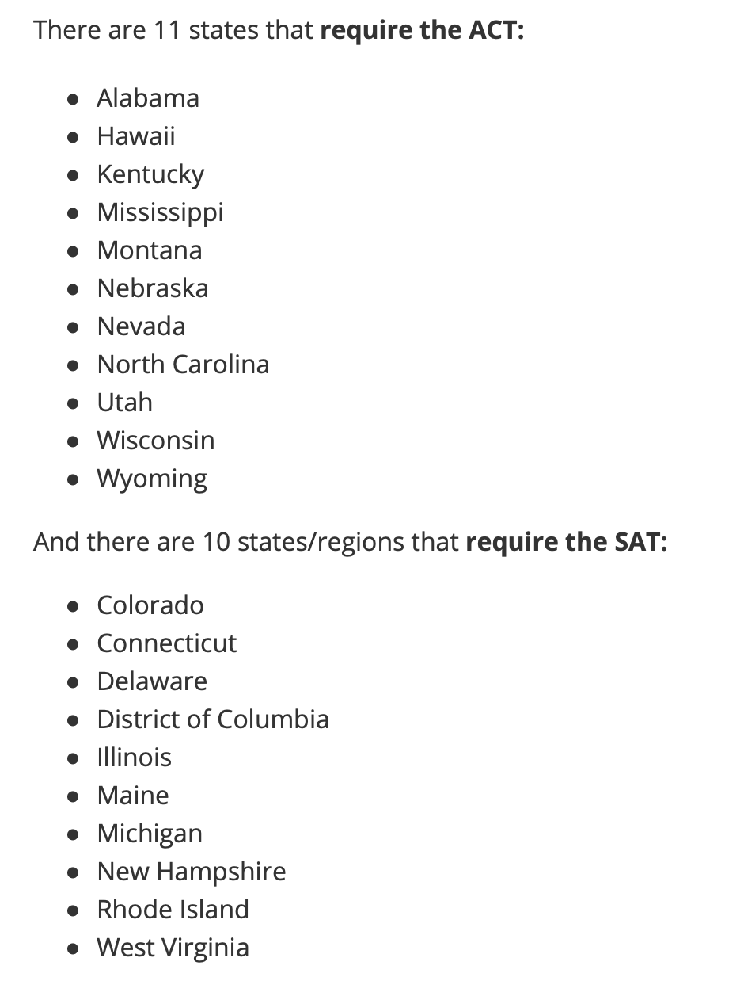
    - https://blog.prepscholar.com/act-vs-sat
    

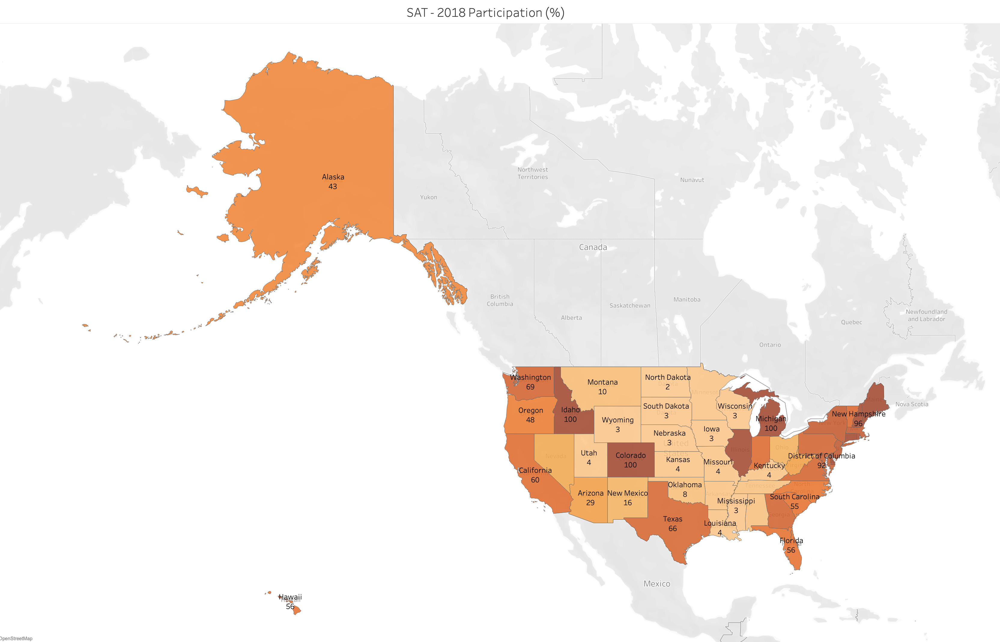

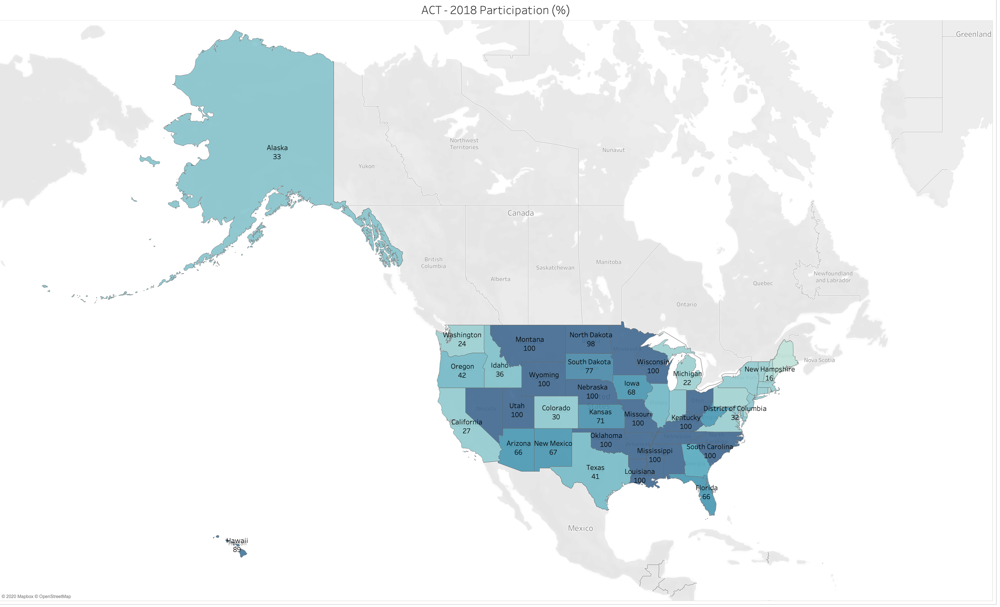

#### Comparing SAT vs ACT Participation Rates by States
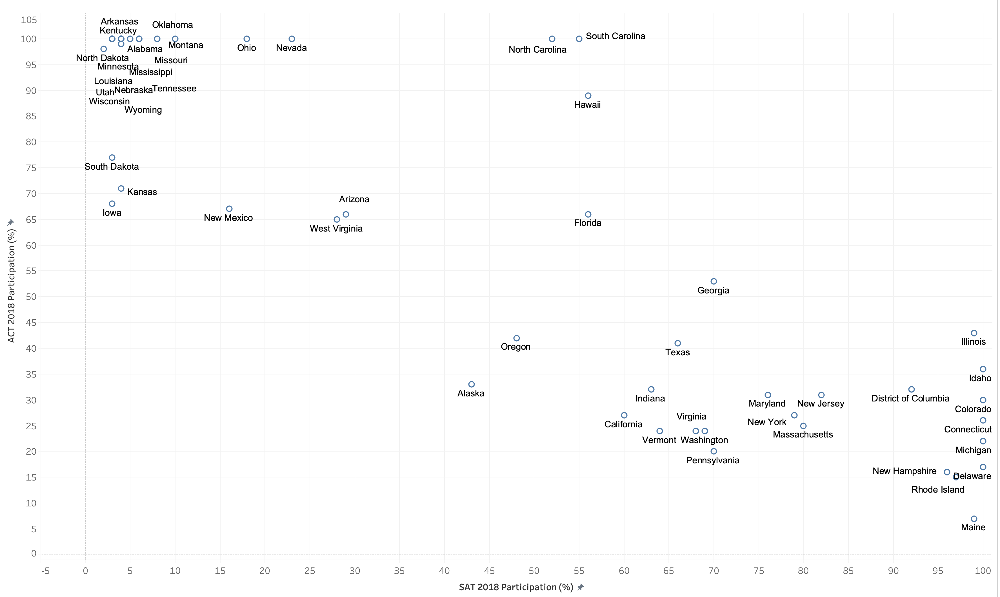

### Observation:
####  We observe that there are some  states that prefers ACT test (100% participation) over SAT(<30%). This could be due to state education policy and the accessibility of the test for each state.
#### We noticed that in some of these states, despite of the low SAT particpation rate, the mean total score is still higher than the aggregated mean score.
#### And despite the high ACT participation rate, the composite score is lower than 1 SD of the composite mean score.
#### For further review, we chose the following states to increase our penetration rate :

    - Louisiana, Arkansas and Arizona as they fulfill the following criterias: 
    
    - Mississippi and Alabama are out of scope as it is a state policy to take ACT test.

     - the 2018 SAT participation rate < 50% and total SAT score > mean of SAT score in 2018
     - and composite score for ACT is less than 1 SD of the mean of ACT composite score in 2018  

In [135]:
print('The SAT_2018 mean total score is : ' + str(round(np.mean(final['sat2018_total']),3)))

The SAT_2018 mean total score is : 1120.02


In [136]:
print('The ACT_2018 mean composite score is : ' + str(round(np.mean(final['act2018_composite']),3)))

The ACT_2018 mean composite score is : 21.486


In [137]:
review=final[(final['sat2018_participation']<50) & (final['sat2018_total']>np.mean(final['sat2018_total'])) & (final['act2018_composite']<np.mean(final['act2018_composite'])-np.std(final['act2018_composite']))][['state','sat2018_participation','sat2018_total','act2018_participation','act2018_composite']].reset_index(drop=True)
review.sort_values('sat2018_total', ascending=False).reset_index(drop=True)

,state,sat2018_participation,sat2018_total,act2018_participation,act2018_composite
0,Mississippi,3,1236,100,18.6
1,Louisiana,4,1210,100,19.2
2,Arkansas,5,1169,100,19.4
3,Alabama,6,1166,100,19.1
4,Arizona,29,1149,66,19.2
5,Nevada,23,1140,100,17.7


In [146]:
states_r=final.loc[final['state'].isin(['Louisiana'])]
sat_2018_r=states_r.loc[:,['state','sat2018_participation','sat2018_evidence_based_rw', 'sat2018_math','sat2018_total']]
act_2018_r=states_r.loc[:,['state','act2018_participation','act2018_english', 'act2018_math','act2018_reading', 'act2018_science','act2018_composite']]

In [147]:
sat_2018_r

,state,sat2018_participation,sat2018_evidence_based_rw,sat2018_math,sat2018_total
18,Louisiana,4,615,595,1210


In [148]:
act_2018_r

,state,act2018_participation,act2018_english,act2018_math,act2018_reading,act2018_science,act2018_composite
18,Louisiana,100,19.0,18.5,19.6,19.1,19.2


In [145]:
### ACT 2018 Mean score  
act_2018[['state','act2018_participation','act2018_english', 'act2018_math','act2018_reading', 'act2018_science','act2018_composite']].mean()

act2018_participation    61.647059
act2018_english          20.988235
act2018_math             21.125490
act2018_reading          22.015686
act2018_science          21.345098
act2018_composite        21.486275
dtype: float64

In [150]:
sat_2018[['state','sat2018_participation','sat2018_evidence_based_rw', 'sat2018_math','sat2018_total']].mean()

sat2018_participation          45.745098
sat2018_evidence_based_rw     563.686275
sat2018_math                  556.235294
sat2018_total                1120.019608
dtype: float64

## Conclusions and Recommendations

Based on your exploration of the data, what are you key takeaways and recommendations? Choose one state with a lower participation rate and provide a suggestion for how the College Board might increase participation amongst graduating seniors in this state. Are there additional data you desire that would better inform your investigations?

Based on the findings and observation, I would recommend that the College Board to consider SAT penetration in the state of Louisiana. This is based on the participation rate as well as the scores for the SAT test as compared to ACT. Additional data to form a better assessment would be the population of students in each state, college admission by SAT/ACT scores, graduate's college debt by state, no of universities in per state...